# <p style="background-color:green;font-family:newtimeroman;font-size:200%;color:white;text-align:center;border-radius:20px 20px;"><b>Google Play Store App EDA & Data Visualization</b></p>
![](https://www.techproeducation.com/logo/headerlogo.svg)

<b>Yeniliklerden ilk siz haberdar olmak istiyorsanız lütfen bizi takip etmeyi unutmayın </b>[YouTube](https://www.youtube.com/c/techproeducation) | [Instagram](https://www.instagram.com/techproeducation) | [Facebook](https://www.facebook.com/techproeducation) | [Telegram](https://t.me/joinchat/HH2qRvA-ulh4OWbb) | [Watsapp](https://api.whatsapp.com/send/?phone=%2B15853042959&text&type=phone_number&app_absent=0) | [Linkedin](https://www.linkedin.com/company/techproeducation/mycompany/) |

![](https://www.akademiportal.com/wp-content/uploads/2015/05/Google-Play-Logo-Before-and-After.png.webp)

<b> Bu not notebook ile google play store uygulama veri kümesi için EDA ve veri görselleştirmenin nasıl yapılacağı anlatılacaktır.

<b>İçindekiler:</b>
<ul>
<li><a href="#load">Loading the dataset (Veri setini yükleme)</a></li>
    
<li><a href="#understanding">Understanding the dataset(Veri setini anlama)</a></li>
    
<li><a href="#missing">Handling missing data (Kayıp verilerin ele alınması)</a></li>
    
<li><a href="#preprocessing">Data preprocessing (Veri ön işleme)</a></li>
    
<li><a href="#visualization">Data visualization (Veri görselleştirme)</a></li>
    
</ul>

**Faydalı olması temennisiyle**

<a id='load'></a>
# <p style="background-color:green;font-family:newtimeroman;font-size:150%;color:white;text-align:center;border-radius:20px 20px;"><b>Loading The Dataset (Veri Setini Yükleme)</b></p>

**Apps dataset nedir?**

Bu data seti Google Play'deki uygulamaların ayrıntılarını içermektadir. Bu ayrıntılar 9 tane (column) tarafından açıklanmaktadır.
<ul>
    <li><b>App:</b> Uygulamanın adı</li>
    <li><b>Category:</b> Uygulamanın kategorisi. Örnek kategoriler: ART_AND_DESIGN, FINANCE, COMICS, BEAUTY vb.</li>
    <li><b>Rating:</b> Kullanıcılar tarafından verilen ortalama puan (5 üzerinden)/li>
    <li><b>Reviews:</b> Kullanıcılar tarafından uygulamanın aldığı toplam yorum sayısı./li>
    <li><b>Size:</b> Uygulamanın boyutu megabayt (MB) cinsinden</li>
    <li><b>Installs:</b> Uygulamanın Google Play'den kaç kez indirildiği bilgisi</li>
    <li><b>Type:</b> Uygulamanın ücretsiz mi yoksa ücretli mi olduğu bilgisi</li>
    <li><b>Price:</b> Uygulamanın fiyatı, Amerikan Doları (USD) cinsinden 0 ücretsiz demek</li>
    <li><b>Content Rating:</b> Uygulamanın içerik derecelendirmesi. Örneğin, "Everyone" herkes için uygun olduğunu gösterir.</li>
    <li><b>Genres:</b> Uygulamanın türü veya alt kategorileri. Örneğin, "Art-Design;Pretend Play" iki farklı türü gösterir.</li>
    <li><b>Last Updated:</b> Uygulamanın en son ne zaman güncellendiği. Örneğin, "January 7, 2018</li>
    <li><b>Current Ver:</b> Uygulamanın mevcut versiyonu. Örneğin, "1.0.0"</li>
    <li><b>Android Ver:</b> Uygulamanın çalıştırılabilmesi için gereken minimum Android versiyonu. Örneğin, "4.0.3 and up"</li>
</ul> 

<a id='understanding'></a>
# <p style="background-color:green;font-family:newtimeroman;font-size:150%;color:white;text-align:center;border-radius:20px 20px;"><b>Import Library(Kütüphaneleri Yükleme)</b></p>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#import missingno as msno
#import plotly.express as px
#import folium
from folium import plugins
from matplotlib.widgets import Slider

%matplotlib inline
#%matplotlib notebook
plt.rcParams["figure.figsize"] = (15,10)
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

In [2]:
df = pd.read_csv('googleplaystore.csv')
df.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up


<a id='understanding'></a>
# <p style="background-color:green;font-family:newtimeroman;font-size:150%;color:white;text-align:center;border-radius:20px 20px;"><b>Understanding the dataset(Veri setini anlama)</b></p>

Data setimdeki columnların isimlerini bir göreyim acaba düzeltmem gereken bir husus var mı?

**Kod Açıklaması**

**df.columns**, bir pandas veri çerçevesinin sütun (kolon) adlarını döndüren bir özelliktir. Bu özellik kullanıldığında, veri çerçevesindeki sütunların isimlerini içeren bir liste veya dizi elde edilir.

In [3]:
df.columns

Index(['App', 'Category', 'Rating', 'Reviews', 'Size', 'Installs', 'Type',
       'Price', 'Content Rating', 'Genres', 'Last Updated', 'Current Ver',
       'Android Ver'],
      dtype='object')

Column isimlerinde boşluk istenmez bu kapsamda bu boşlukları hep kullandığımız underscore_ ile değiştirmeyi düşünmek uygun olur.

**Kod açıklaması**

**df.columns:** Bu ifade, veri çerçevesinin sütun adlarını temsil eden bir özelliktir. Bu özellik, veri çerçevesindeki sütun adlarını içeren bir dizi veya liste döndürür.

**.str.replace(" ", "_"):** Bu ifade, her bir sütun adındaki boşlukları "" ile değiştirir. str.replace() yöntemi, bir dize içinde belirli bir alt dizeyi (boşluk karakteri " " burada) başka bir alt dize ile (alt çizgi "" burada) değiştirir. Bu, sütun adları içindeki boşlukları alt çizgi ile değiştirerek sütun adlarını yeniden biçimlendirir.

**Sonuç olarak** Bu kod satırı, sütun adlarının boşluklarını alt çizgilerle değiştirerek daha kullanışlı ve işlenebilir sütun adları elde etmenize yardımcı olur. Bu, sütun adlarını tek bir düzende tutmak ve sütunlara daha kolay erişim sağlamak için yaygın bir uygulamadır.

In [4]:
df.columns = df.columns.str.replace(" ","_")

In [5]:
df.columns

Index(['App', 'Category', 'Rating', 'Reviews', 'Size', 'Installs', 'Type',
       'Price', 'Content_Rating', 'Genres', 'Last_Updated', 'Current_Ver',
       'Android_Ver'],
      dtype='object')

Data setini anlamak bizler için önemli olduğundan bir bakalım data setimiz kaç satırdan ve sütundan oluşuyor

**Kod Açıklaması**

df.shape, bir pandas veri çerçevesinin boyutunu (satır ve sütun sayısı) döndüren bir özelliktir. Bu özellik kullanıldığında, veri çerçevesinin kaç satır ve kaç sütundan oluştuğunu gösteren bir tuple elde edilir.

In [6]:
df.shape

(10841, 13)

Let me show the types of columns.

In [7]:
df.dtypes

App                object
Category           object
Rating            float64
Reviews            object
Size               object
Installs           object
Type               object
Price              object
Content_Rating     object
Genres             object
Last_Updated       object
Current_Ver        object
Android_Ver        object
dtype: object

<a id='missing'></a>
# <p style="background-color:green;font-family:newtimeroman;font-size:150%;color:white;text-align:center;border-radius:20px 20px;"><b>Understanding the dataset(Veri setini anlama)</b></p>

Eskik veriler çok önemli olduğundan columnlarımızdaki eksik verilere bir bakalım

**Kod Açıklaması**

**df.isnull().sum()** kodu, bir pandas DataFrame'de (df olarak adlandırılmış) her bir sütun için eksik (NaN veya None) değerlerin sayısını döndürür.

**Sonuç olarak** Bu kod, veri temizliği ve önişleme aşamalarında genellikle çok kullanışlıdır, çünkü eksik verilerin hangi sütunlarda olduğunu hızlı bir şekilde görmemizi sağlar.

In [8]:
df.isnull().sum()

App                  0
Category             0
Rating            1474
Reviews              0
Size                 0
Installs             0
Type                 1
Price                0
Content_Rating       1
Genres               0
Last_Updated         0
Current_Ver          8
Android_Ver          3
dtype: int64

Bu missing verileri seaborn kullanarak görselleştirebiliriz. Bunu görselleştirme kütüphaneleri kullanarak yapalım.

**Kod Açıklaması**

**import matplotlib.pyplot as plt:** matplotlib kütüphanesinin pyplot modülünü plt olarak kısaltma ile içe aktarır. Bu, çeşitli türlerde grafikler ve görselleştirmeler oluşturmak için kullanılır.

**import seaborn as sns:** seaborn kütüphanesini sns olarak kısaltma ile içe aktarır. Seaborn, matplotlib üzerine kurulu, daha yüksek seviyeli ve daha görsel olarak çekici grafikler oluşturmayı kolaylaştıran bir Python kütüphanesidir.

**sns.set_theme():** Seaborn'un varsayılan tema ayarlarını kullanır. Bu, oluşturulan tüm grafiklerin bir tutarlı görünüme sahip olmasını sağlar.

**sns.set(rc={"figure.dpi":300, "figure.figsize":(12,9)}):** Bu satır, oluşturulan grafiklerin çözünürlüğünü ve boyutunu ayarlar.

**"figure.dpi": 300:** DPI (dots per inch) ayarını 300 olarak belirler, bu da grafiklerin daha yüksek çözünürlüklü olmasını sağlar.

**"figure.figsize": (12, 9):** Oluşturulan grafiklerin boyutunu 12x9 inç olarak ayarlar.

**Sonuç olarak** Bu kod parçası, genellikle bir veri analizi veya görselleştirme projesinin başında yer alır, böylece tüm grafikler aynı tema ve boyut ayarlarını kullanır.

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
# Let's set the theme of plots.
sns.set_theme()
sns.set(rc={"figure.dpi":300, "figure.figsize":(12,9)})

Eksik verileri görmek için heatmap'i (ısı haritası yöntemini) kullanacağım.

**Kod Açıklaması**

**sns.heatmap(df.isnull(), cbar=False)** kodu, bir DataFrame'de (df olarak adlandırılmış) eksik verilerin (NaN veya None) nerede olduğunu görselleştirmek için bir ısı haritası oluşturur. cbar=False parametresi, renk çubuğunun (color bar) gösterilmemesini sağlar.

**Bu ısı haritasında:**

Eksik değerler (True), genellikle beyaz veya açık bir renkle gösterilir.
Eksik olmayan değerler (False), genellikle siyah veya koyu bir renkle gösterilir.
Bu görselleştirme, hangi sütunlarda ve satırlarda eksik verilerin yoğunlaştığını hızlıca görmek için oldukça kullanışlıdır. 

<AxesSubplot:>

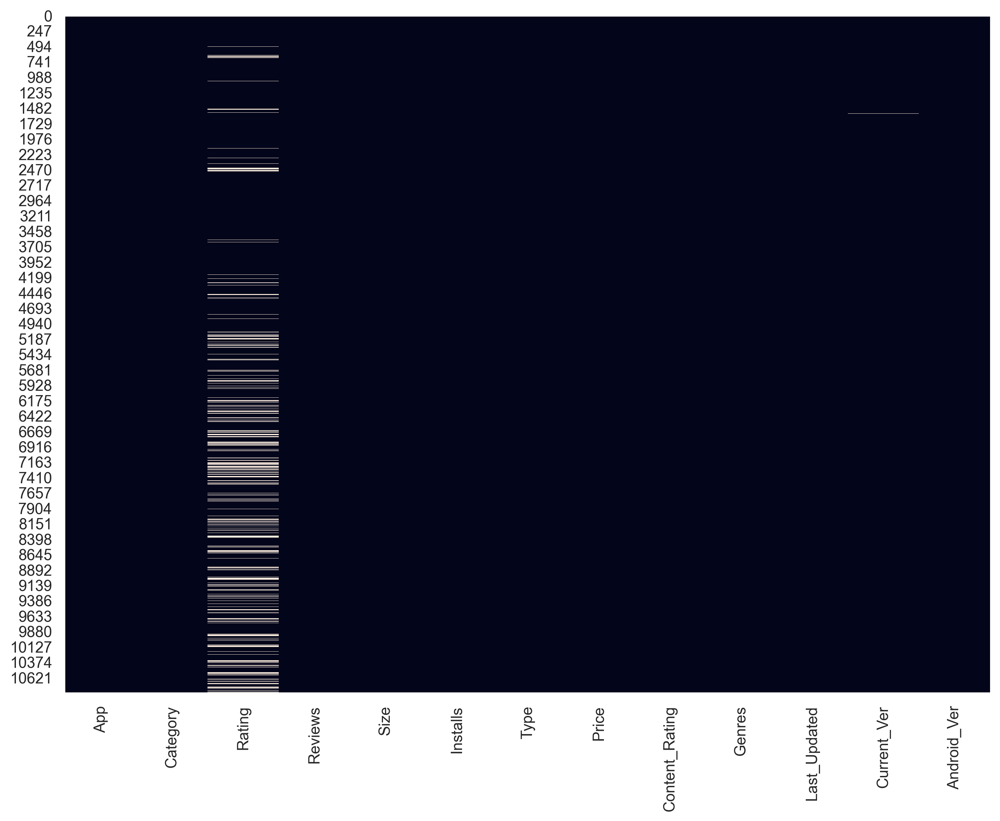

In [10]:
sns.heatmap(df.isnull(), cbar=False)

Eksik verileri görmek için extra bir kütüphane var ve çok güçlü bunun için alternatif bir çözüm olması açısından bunuda paylaşmayı faydalı buluyorum.

In [11]:
#pip install missingno ## Install yapmak için
import missingno as msno

**Kod Açıklaması**

**msno.bar(df);** kodu, missingno kütüphanesini (genellikle msno olarak kısaltılır) kullanarak veri setindeki eksik değerleri bar grafik şeklinde gösterir. Her bir bar, bir sütunu temsil eder ve barın yüksekliği, o sütundaki eksik olmayan değerlerin sayısını gösterir.

Bu tür bir görselleştirme, eksik verilerin hangi sütunlarda yoğunlaştığını hızlı bir şekilde anlamanıza yardımcı olabilir. Eksik verilerin olduğu sütunlar, veri temizleme veya önişleme aşamalarında özel dikkat gerektirebilir.

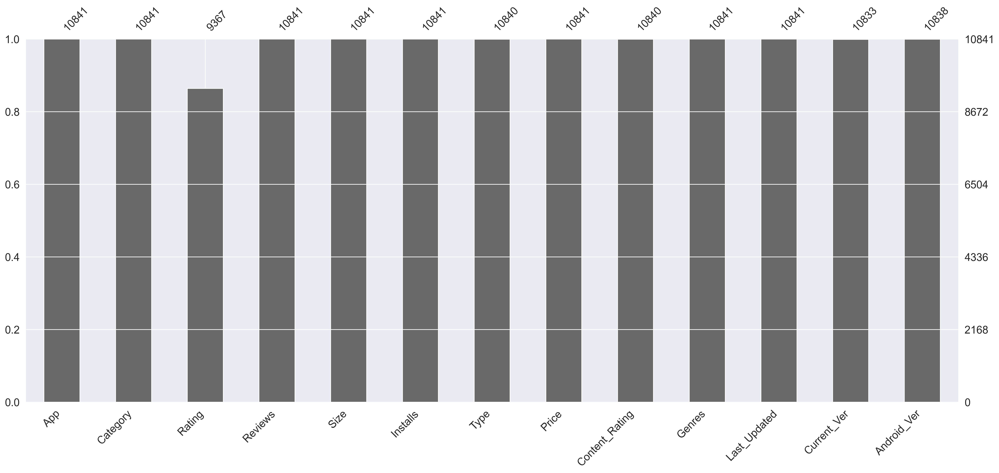

In [12]:
#bar chart olarak görmek için
msno.bar(df);

**Output Açıklaması**

**Yatay Eksen (X Ekseni):** Bu eksen, veri setindeki sütun isimlerini gösterir. Her bir sütun, bir bar ile temsil edilir.

**Dikey Eksen (Y Ekseni):** Bu eksen, her bir sütundaki eksik olmayan değerlerin sayısını gösterir. Eğer bir bar tamamen doluysa, bu o sütunda hiç eksik değer olmadığı anlamına gelir. Eğer bir bar tamamen dolu değilse, eksik değerler olduğu anlamına gelir.

**Barlar:** Her bir bar, bir sütunu temsil eder. Barın yüksekliği, o sütundaki eksik olmayan değerlerin sayısını gösterir. Barın rengi genellikle eksik olmayan değerlerin sayısını görselleştirmek için kullanılır. Tamamen dolu bir bar, o sütunda hiç eksik değer olmadığını gösterir.

**Barlar Üzerindeki Sayılar:** Bu sayılar, genellikle her bir sütundaki eksik olmayan değerlerin tam sayısını gösterir.

**Grafiğin sağ dış tarafında yer alan sayılar:** Bu sayılar gözlem sayılarını rakamsal olarak göstermektedir.

**Grafiğin sol dış tarafında yer alan sayılar:** Bu sayılar gözlem sayılarını oransal olarak göstermektedir.

**Kod açıklaması** msno.matrix(df);

**msno.matrix(df);** kodu, missingno kütüphanesini kullanarak veri setindeki eksik değerleri bir matris grafiği şeklinde gösterir. Bu görselleştirme, veri setindeki eksik değerlerin yapısını anlamak için oldukça yararlıdır.

Bu tür bir görselleştirme, eksik değerlerin hangi sütunlarda ve satırlarda yoğunlaştığını, ayrıca eksik değerlerin veri seti boyunca nasıl dağıldığını görmek için oldukça yararlıdır. Örneğin, eğer belirli bir sütunda çok fazla eksik değer varsa veya eksik değerler belirli bir desen gösteriyorsa, bu sütun veya desen üzerinde daha fazla çalışma yapmanız gerekebilir.

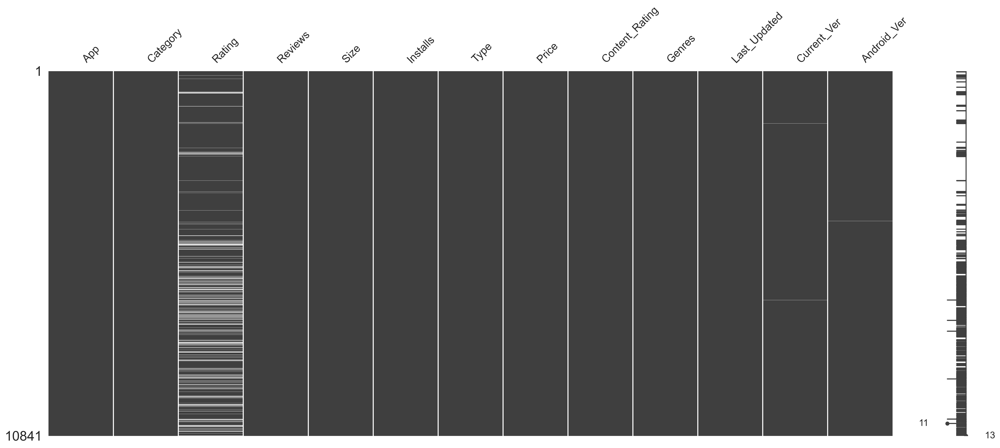

In [13]:
#Matrix chart olarak görmek için
msno.matrix(df);

**Output Açıklaması**

**Yatay Eksen (X Ekseni):** Bu eksen, veri setindeki sütun isimlerini gösterir. Her bir sütun, bir dizi nokta veya çizgi ile temsil edilir.

**Dikey Eksen (Y Ekseni):** Bu eksen, veri setindeki satır indekslerini gösterir. Her bir satır, yatay eksende belirtilen sütunlardaki değerlerin var olup olmadığına göre bir dizi nokta veya çizgi ile temsil edilir.

**Noktalar ve Çizgiler:** Eğer bir değer eksikse, o nokta beyaz olarak gösterilir; eğer değer eksik değilse, o nokta gri veya siyah olarak gösterilir. Bu sayede, hangi sütunlarda ve satırlarda eksik değerlerin olduğunu görebilirsiniz.

**Sağ Taraftaki Bar:** Bu bar, her bir satırdaki eksik olmayan değerlerin sayısını gösterir. Bu, eksik değerlerin veri seti boyunca nasıl dağıldığını anlamanıza yardımcı olabilir.

Bu görsel ile Raiting sütununda çok fazla eksik veri var olduğunu gördük.

- Bu eksik verilerle mücadele etmenin bir çok yolu var hatta bu makine öğrenmesi için önemli bir alan. Bu alan ayrı bir iş alanı olarak bilinmektedir. 

- Ben bugün missing value yani eksik veriler için sık kullanılan bir yöntem olan bu değerleri medyan ile doldurma seçeneğini kullanacağım. Neden medyan derseniz özellikle aykırı olan değerler için duyarlıdır.

- Eksik verileri doldururken ortalama kullanmadan önce datada mevcut aykırı değerleri her zaman akılda bulundurmak gerekir. 

- Aykırı değerlerin fazla olduğu data setinde ortalama tercihi yanlış olabilir.

**Şimdi bir kod ile**

"Rating" sütunundaki eksik değerleri bu sütunun ortanca değeri ile doldurarak veri setindeki eksik veriler ile mücadele etmiş olacağım. Bu, veri analizi veya makine öğrenimi projelerinde eksik veri sorunlarını çözmek için yaygın bir yaklaşımdır, çünkü eksik veriler çoğu veri analizi algoritması tarafından doğru bir şekilde işlenmez.

**Kod Açıklaması**


**rating_median = df["Rating"].median():** Bu satır, "Rating" adlı sütundaki verilerin ortanca (median) değerini hesaplar ve bu değeri "rating_median" adlı bir değişkene atar. Ortanca, veri setinin sıralandığında ortada bulunan değerdir ve veri setindeki değerlerin yarıdan fazlasını temsil eder.

**print(rating_median):** Ortanca değeri ekrana yazdırmak için kullanılır. Bu, hesaplanan ortanca değeri görmemizi sağlar.

**df["Rating"].fillna(rating_median, inplace=True):** Bu satır, "Rating" sütunundaki eksik değerleri ("NaN" olarak temsil edilir) "rating_median" değeri ile doldurur. fillna işlevi, belirtilen sütundaki eksik değerleri doldurmak için kullanılır. inplace=True parametresi, bu değişikliğin veri çerçevesine doğrudan uygulanmasını sağlar, yani yeni bir veri çerçevesi oluşturmak yerine mevcut veri üzerinde değişikliği sabit kılar.

**Sonuç olarak:** Bu kod parçası, "Rating" sütunundaki eksik değerleri bu sütunun ortanca değeri ile doldurarak veri setindeki eksik verilerle başa çıkar. Bu, veri analizi veya makine öğrenimi projelerinde eksik veri sorunlarını çözmek için yaygın bir yaklaşımdır, çünkü eksik veriler çoğu veri analizi algoritması tarafından doğru bir şekilde işlenmez.

In [14]:
rating_median = df["Rating"].median()
print(rating_median)
df["Rating"].fillna(rating_median, inplace=True)

4.3


Onun dışında Current_Ver column unda daha az sayıda eksiklik olduğundan bunları direk düşmekte sakınca görmüyorum.

**Kod Açıklaması**

**df:** Bu, işlem yapılacak olan veri çerçevesini temsil eden bir değişken adıdır. "df" genellikle "DataFrame" kelimesinin kısaltması olarak kullanılır.

**dropna():** Bu, pandas veri çerçeveleri üzerinde kullanılabilen bir yöntemdir. "dropna" yöntemi, bir veri çerçevesindeki eksik değerlere sahip olan satırları (gözlemleri) kaldırmak için kullanılır.

**inplace=True:** Bu parametre, işlemin mevcut veri çerçevesine uygulanmasını sağlar. Yani, bu parametre "True" olarak ayarlandığında, işlem veri çerçevesini doğrudan değiştirir ve yeni bir veri çerçevesi oluşturmaz.

**Sonuç olarak:** Bu kod parçası, veri çerçevesindeki herhangi bir satırın en az bir eksik değere sahip olduğu durumları tanımlar ve bu satırları veri çerçevesinden kaldırır. Eksik değerler, genellikle "NaN" (Not a Number) olarak temsil edilir ve veri çerçevesindeki bu eksik değerlere sahip satırlar, analiz veya model eğitimi sırasında istenmeyen sonuçlara neden olabilir. Bu nedenle eksik değerlere sahip satırları kaldırmak, veri setinin temizlenmesine yardımcı olabilir.

In [15]:
df.dropna(inplace=True)

Tekrar missing value kontrolü yapıyorum ve kayıp verimin artık olmdığını görüyorum

**Kod Açıklaması**

**df:** Bu, veri çerçevesini temsil eden bir değişken adıdır.

**isnull():** Bu, bir veri çerçevesindeki her bir hücrenin eksik (NaN) olup olmadığını kontrol eder ve her hücre için "True" (eksik) veya "False" (eksik değil) bir değer döndürür.

**sum():** Bu, "True" değerlerin sayısını toplar. Yani, her sütun için eksik değerlerin sayısını hesaplar.

**İkinci sum():** İlk sum() işlemi sonucunda hesaplanan her sütun için eksik değerlerin sayısını toplar. Böylece, veri çerçevesindeki tüm eksik değerlerin toplam sayısını verir.

**Sonuç olarak:** df.isnull().sum().sum() ifadesi, veri çerçevesindeki tüm eksik değerlerin toplam sayısını verir. Bu, veri setinde ne kadar eksik veri olduğunu anlamak ve eksik değerlerle başa çıkmak için önemli bir adımdır.







In [16]:
df.isnull().sum().sum()

0

Şimdi ise data setimizin bir özetine bakalım kaç satır kaç sütundan oluşuyor ve column ların type ları nedir. Kayıp veri var mı vs.

**Kod Açıklaması**


**df.info()** bir pandas veri çerçevesinin hızlı bir genel bilgisini sağlayan bir yöntemdir. Bu yöntem, veri çerçevesinin yapısını ve içeriğini özetler.

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10829 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10829 non-null  object 
 1   Category        10829 non-null  object 
 2   Rating          10829 non-null  float64
 3   Reviews         10829 non-null  object 
 4   Size            10829 non-null  object 
 5   Installs        10829 non-null  object 
 6   Type            10829 non-null  object 
 7   Price           10829 non-null  object 
 8   Content_Rating  10829 non-null  object 
 9   Genres          10829 non-null  object 
 10  Last_Updated    10829 non-null  object 
 11  Current_Ver     10829 non-null  object 
 12  Android_Ver     10829 non-null  object 
dtypes: float64(1), object(12)
memory usage: 1.2+ MB


<a id='preprocessing'></a>
# <p style="background-color:green;font-family:newtimeroman;font-size:150%;color:white;text-align:center;border-radius:20px 20px;"><b>Data preprocessing (Veri ön işleme)</b></p>

Data setimiz içinde nümerik olmayan veri istemiyoruz kısaca tüm string ifadelerinde nümerik olması gerekiyor (Hedef değişken (Target Variable) istisna) bu kapsamda data setimizde bu kapsamda ön işlemle işlemleri gerçekleştireceğiz.

## <font color='green'> <b>Reviews column'unu ele alalım </b><font color='black'>

Reviews column undaki değerleri nümerik hale getireceğim.

**df["Reviews"].describe()** kodu, pandas DataFrame'de (df olarak adlandırılmış) "Reviews" sütununun temel istatistiklerini döndürür. Bu istatistikler genellikle şunları içerir:

- **count:** Eksik olmayan değerlerin sayısı.
- **mean:** Ortalama değer.
- **std:** Standart sapma.
- **min:** Minimum değer.
- **25%:** Birinci çeyreklik (Q1), yani veri setinin alt %25'lik diliminin üst sınırı.
- **50%:** Medyan (Q2), yani veri setinin ortanca değeri.
- **75%:** Üçüncü çeyreklik (Q3), yani veri setinin üst %25'lik diliminin alt sınırı.
- **max:** Maksimum değer.

Bu kod parçası, "Reviews" sütununun genel bir özetini sağlar ve bu sütunun dağılımı, merkezi eğilim ve değişkenlik hakkında fikir verir. Örneğin, çok yüksek veya çok düşük "Reviews" değerleri olup olmadığını, değerlerin ne kadar değişken olduğunu vb. görebilirsiniz.

Bu tür bir analiz, veri önişleme ve temizleme aşamalarında, ayrıca modelleme aşamasına geçmeden önce veri setinin genel bir anlayış kazanılması için oldukça yararlıdır.

- **count:** 10,829 eksik olmayan değer var.
- **unique:** Bu 10,829 değerden 5,999 tanesi benzersiz.
- **top:** En sık rastlanan değer "0".
- **freq:** "0" değeri 594 kez tekrar ediyor.

Bu istatistikler, "Reviews" sütununun bir **kategorik** veya **metin** verisi olarak algılandığını gösteriyor. Eğer bu sütun sayısal bir veri türüne sahipse (yani, yorum sayıları), bu sütunu bir sayısal veri türüne (örneğin, int veya float) dönüştürmeniz faydalı olabilir. Bu dönüşüm, daha sonra bu sütun üzerinde sayısal analizler yapmayı kolaylaştırır.

"0" değerinin yüksek frekansı, bu sütunda birçok uygulamanın hiç yorum almadığını veya bu verinin eksik olduğunu gösteriyor olabilir. Bu tür durumlar, veri setini analiz ederken veya model oluştururken dikkate alınmalıdır.

Bu istatistikler ayrıca, "Reviews" sütununun veri setinde nasıl bir dağılım gösterdiği hakkında genel bir fikir verir. Örneğin, en sık rastlanan değer ve frekansı, veri setinin ne kadar çeşitli olduğu veya belirli bir değerin ne kadar yaygın olduğu hakkında bilgi sağlar.

In [18]:
df["Reviews"].describe()

count     10829
unique     5999
top           0
freq        594
Name: Reviews, dtype: object

Yukarıdaki yazdığımız df.info() kodu ve df["Reviews"].describe() kodu ile Reviews column unun her nekadar sayısal gibi görsekte aslında type ının object olduğu görülmektedir. Bu sebeple bu column daki değerleri nümerik yapacağız. 

**Kod Açıklaması**

**df["Reviews"] = df["Reviews"].astype("int64")** kodu, pandas DataFrame'de (df olarak adlandırılmış) "Reviews" sütununun veri tipini int64 olarak değiştirir. Bu, eğer "Reviews" sütunu sayısal değerler içeriyorsa fakat bu değerler bir sayısal veri tipine sahip değilse (örneğin, object veya string olarak saklanıyorsa) kullanılır.

Bu dönüşüm, "Reviews" sütunu üzerinde sayısal analizler yapmayı ve bu sütunu sayısal bir modelde kullanmayı mümkün kılar. Örneğin, şimdi bu sütunun ortalamasını, medyanını, standart sapmasını vb. hesaplayabilirsiniz.

Ancak, bu kodu çalıştırmadan önce "Reviews" sütununda hiç eksik (NaN) veya metinsel değer olmadığından emin olmalısınız. Eğer varsa, astype("int64") dönüşümü hata verecektir. Eksik veya metinsel değerler varsa, bu değerleri uygun bir şekilde doldurmanız veya çıkartmanız gerekecektir.

In [19]:
df["Reviews"] = df["Reviews"].astype("int64")

describe kodunu tekrar yazdığımda çıktının nümerik dataya göre geldiğini görüyorum. Kısaca amacıma ulaştım.

**df["Reviews"].describe()** kodu, pandas DataFrame'de (df olarak adlandırılmış) "Reviews" sütununun temel istatistiklerini döndürür. Bu istatistikler genellikle şunları içerir:

- **count:** Eksik olmayan değerlerin sayısı.
- **mean:** Ortalama değer.
- **std:** Standart sapma.
- **min:** Minimum değer.
- **25%:** Birinci çeyreklik (Q1), yani veri setinin alt %25'lik diliminin üst sınırı.
- **50%:** Medyan (Q2), yani veri setinin ortanca değeri.
- **75%:** Üçüncü çeyreklik (Q3), yani veri setinin üst %25'lik diliminin alt sınırı.
- **max:** Maksimum değer.

Bu kod parçası, "Reviews" sütununun genel bir özetini sağlar ve bu sütunun dağılımı, merkezi eğilim ve değişkenlik hakkında fikir verir. Örneğin, çok yüksek veya çok düşük "Reviews" değerleri olup olmadığını, değerlerin ne kadar değişken olduğunu vb. görebilirsiniz.

Bu tür bir analiz, veri önişleme ve temizleme aşamalarında, ayrıca modelleme aşamasına geçmeden önce veri setinin genel bir anlayış kazanılması için oldukça yararlıdır.

In [20]:
df["Reviews"].describe().round()

count       10829.0
mean       444602.0
std       2929213.0
min             0.0
25%            38.0
50%          2100.0
75%         54815.0
max      78158306.0
Name: Reviews, dtype: float64

## <font color='green'> <b>Size column'unu ele alalım </b><font color='black'>   

Bu kod parçası, "Size" sütununda kaç farklı benzersiz değer olduğunu ve bu benzersiz değerlerin ne olduğunu gösterir.

**print(len(df["Size"].unique())):** "Size" sütununda kaç farklı benzersiz değer olduğunu ekrana yazdırır. len() fonksiyonu, unique() fonksiyonunun döndürdüğü benzersiz değerlerin sayısını hesaplar.

**df["Size"].unique():** "Size" sütununda yer alan benzersiz değerleri bir dizi (array) veya liste şeklinde döndürür.

Bu kodlar, "Size" sütununun ne kadar çeşitli olduğunu anlamak için yararlıdır. Örneğin, eğer çok fazla benzersiz değer varsa, bu sütunu modellemede kullanırken bazı önişleme adımları yapmanız gerekebilir (örneğin, kategorik bir değişken olarak kodlama veya sayısal bir değişken olarak dönüştürme).

Ayrıca, bu benzersiz değerlerin ne olduğunu görmek, veri temizliği veya dönüşümü için hangi adımların gerekebileceği konusunda fikir verebilir. Örneğin, eğer "Size" sütunu hem "M" (Megabyte) hem de "K" (Kilobyte) gibi farklı birimler içeriyorsa, bu değerleri aynı birime dönüştürmek gerekebilir.

In [21]:
print(len(df["Size"].unique()))
df["Size"].unique()

457


array(['19M', '14M', '8.7M', '25M', '2.8M', '5.6M', '29M', '33M', '3.1M',
       '28M', '12M', '20M', '21M', '37M', '5.5M', '17M', '39M', '31M',
       '4.2M', '7.0M', '23M', '6.0M', '6.1M', '4.6M', '9.2M', '5.2M',
       '11M', '24M', 'Varies with device', '9.4M', '15M', '10M', '1.2M',
       '26M', '8.0M', '7.9M', '56M', '57M', '35M', '54M', '201k', '3.6M',
       '5.7M', '8.6M', '2.4M', '27M', '2.7M', '2.5M', '16M', '3.4M',
       '8.9M', '3.9M', '2.9M', '38M', '32M', '5.4M', '18M', '1.1M',
       '2.2M', '4.5M', '9.8M', '52M', '9.0M', '6.7M', '30M', '2.6M',
       '7.1M', '3.7M', '22M', '7.4M', '6.4M', '3.2M', '8.2M', '9.9M',
       '4.9M', '9.5M', '5.0M', '5.9M', '13M', '73M', '6.8M', '3.5M',
       '4.0M', '2.3M', '7.2M', '2.1M', '42M', '7.3M', '9.1M', '55M',
       '23k', '6.5M', '1.5M', '7.5M', '51M', '41M', '48M', '8.5M', '46M',
       '8.3M', '4.3M', '4.7M', '3.3M', '40M', '7.8M', '8.8M', '6.6M',
       '5.1M', '61M', '66M', '79k', '8.4M', '118k', '44M', '695k', '1.6M',
     

Bu kod parçası, "Size" sütunundaki değerlerden "M" ve "k" karakterlerini kaldırır.

**df["Size"].replace("M","", regex=True, inplace = True):** "Size" sütununda yer alan "M" karakterlerini boş bir string ("") ile değiştirir. regex=True parametresi, düzenli ifadeleri (regex) etkinleştirir, ancak bu örnekte düzenli ifade kullanılmamıştır. inplace=True parametresi, değişikliklerin aynı DataFrame üzerinde yapılmasını sağlar.

**df["Size"].replace("k","", regex=True, inplace = True):** Aynı işlemi "k" karakterleri için de yapar.

**Önemli!!!**, "M" ve "k" birimlerini kaldırdığınızda, bu değerlerin aslında farklı büyüklükte olduklarını unutmamanız önemlidir (Megabyte ve Kilobyte). Eğer bu iki farklı birimi aynı sütunda tutacaksanız, bir dönüşüm yaparak hepsini aynı birime getirmeniz faydalı olacaktır. Örneğin, tüm değerleri Megabyte cinsinden ifade edebilirsiniz.

In [22]:
df["Size"].replace("M","", regex=True, inplace = True)
df["Size"].replace("k","", regex=True, inplace = True)

In [23]:
df["Size"].unique()

array(['19', '14', '8.7', '25', '2.8', '5.6', '29', '33', '3.1', '28',
       '12', '20', '21', '37', '5.5', '17', '39', '31', '4.2', '7.0',
       '23', '6.0', '6.1', '4.6', '9.2', '5.2', '11', '24',
       'Varies with device', '9.4', '15', '10', '1.2', '26', '8.0', '7.9',
       '56', '57', '35', '54', '201', '3.6', '5.7', '8.6', '2.4', '27',
       '2.7', '2.5', '16', '3.4', '8.9', '3.9', '2.9', '38', '32', '5.4',
       '18', '1.1', '2.2', '4.5', '9.8', '52', '9.0', '6.7', '30', '2.6',
       '7.1', '3.7', '22', '7.4', '6.4', '3.2', '8.2', '9.9', '4.9',
       '9.5', '5.0', '5.9', '13', '73', '6.8', '3.5', '4.0', '2.3', '7.2',
       '2.1', '42', '7.3', '9.1', '55', '6.5', '1.5', '7.5', '51', '41',
       '48', '8.5', '46', '8.3', '4.3', '4.7', '3.3', '40', '7.8', '8.8',
       '6.6', '5.1', '61', '66', '79', '8.4', '118', '44', '695', '1.6',
       '6.2', '53', '1.4', '3.0', '5.8', '3.8', '9.6', '45', '63', '49',
       '77', '4.4', '4.8', '70', '6.9', '9.3', '10.0', '8.1', '36',

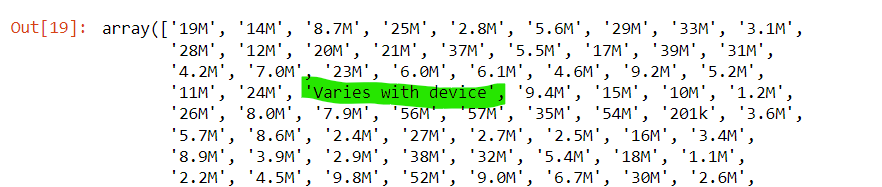

Bakın burada 'Varies with device' var bunuda düzeltmemiz gerek değil mi?

Şimdi "Size" column unda "Varies with device" olarak belirtilmiş değerlerin, bu column un medyanı (ortanca değeri) ile değişitirlmesini sağlayacağız. Bunun için öncelikle "Size" sütununun medyanını hesaplayalayacağız. Sonrada bu değer ile Varies with device değerlerini değiştireceğiz. Bu sayede "Size" sütununda "Varies with device" olarak belirtilmiş değerlerin ne olduğu belirsiz olduğu için, bu değerleri bu sütunun medyanı ile doldurarak aslında bir feature engineering yapıyoruz.

Medyan, genellikle aykırı değerlerin etkisinden daha az etkilenir, bu yüzden eksik veya belirsiz verileri doldurmak için iyi bir seçenek olarak düşünülebilir.

Bu işlemi yapmak için, öncelikle "Varies with device" olmayan satırların medyanını hesaplayabilir ve ardından bu medyan değeri ile "Varies with device" olan satırları değiştirebilirsiniz. 

**Kod Açıklaması**

Bu kod parçası, "Size" sütununda "Varies with device" değerine sahip olmayan satırların medyanını (ortanca değerini) hesaplar. İşte kodun bileşenlerinin açıklamaları:

**df[df["Size"]!="Varies with device"]:** DataFrame'den ("df"), "Size" sütunu "Varies with device" olmayan satırları seçer.

**["Size"].astype(float):** Seçilen satırların "Size" sütununu float türüne dönüştürür. Bu, medyanı hesaplamak için gereklidir çünkü medyan, sayısal bir ölçüdür.

**.median():** Dönüştürülen "Size" sütununun medyanını hesaplar.

Sonuç olarak, size_median değişkeni bu medyan değerini saklar. Bu değer, "Size" sütununda "Varies with device" olarak belirtilmiş veya eksik olan değerleri doldurmak için kullanılabilir. Medyan, veri setindeki aykırı değerlerden daha az etkilendiği için, genellikle eksik verileri doldurmak için iyi bir seçenektir.

In [24]:
size_median = df[df["Size"]!="Varies with device"]["Size"].astype(float).median()
size_median

15.0

**Kod Açıklaması**

Bu kod parçası, "Size" sütununda "Varies with device" olarak belirtilmiş değerleri, daha önce hesaplanmış olan size_median (medyan) değeri ile değiştirir.

**df["Size"].replace("Varies with device", size_median, inplace=True):** "Size" sütununda "Varies with device" olarak belirtilmiş tüm değerleri size_median ile değiştirir. inplace=True parametresi, değişikliklerin aynı DataFrame üzerinde yapılmasını sağlar.

Bu işlem, "Size" sütununda belirsiz olan değerleri bir sayısal değerle doldurur, böylece bu sütun daha sonra sayısal analizler veya makine öğrenimi modelleri için kullanılabilir hale gelir. Bu tür bir değişiklik, genellikle öznitelik mühendisliği olarak kabul edilir, çünkü modelin bu öznitelikten (sütundan) daha etkili bir şekilde yararlanabilmesi için veriyi dönüştürmeyi amaçlar.

In [25]:
df["Size"].replace("Varies with device", size_median, inplace=True)

Şimdi Size column unu nümerik hale getirelim

**Kod Açıklaması**

Bu kod parçası, "Size" sütununu sayısal bir formata (örneğin, float veya int) dönüştürür.

**pd.to_numeric(df.Size):** Pandas'ın to_numeric fonksiyonu, "Size" sütunundaki değerleri sayısal bir formata dönüştürür. Eğer dönüşüm sırasında bir hata olursa (örneğin, sayısal olmayan bir değer varsa), bir hata mesajı döndürecektir.

**df.Size = ...:** Dönüştürülen sütunu, orijinal DataFrame'deki "Size" sütunu ile değiştirir.

Bu işlem, "Size" sütununun sayısal analizler veya makine öğrenimi modelleri için kullanılabilir hale gelmesini sağlar. Eğer bu sütun zaten sayısal bir formatta ise, bu işlem etkisiz olacaktır. Ancak, eğer sütun sayısal olmayan değerler içeriyorsa (ve bu değerler daha önce temizlenmemişse), to_numeric fonksiyonu bir hata mesajı döndürecektir. Bu yüzden, bu kodu çalıştırmadan önce sütunun sayısal değerler içerdiğinden emin olmalısınız.

In [26]:
df.Size = pd.to_numeric(df.Size)

**Kod Açıklaması**

**df.Size.head()** kodu, DataFrame'deki ("df") "Size" sütununun ilk beş satırını döndürür. Bu, genellikle veri temizliği veya dönüşüm işlemleri yaptıktan sonra değişikliklerin doğru bir şekilde uygulanıp uygulanmadığını kontrol etmek için kullanılır.

Eğer "Size" sütununu sayısal bir formata dönüştürdüyseniz (örneğin, pd.to_numeric(df.Size) kodunu kullanarak), bu kodun çıktısı ilk beş satırın sayısal değerlerini gösterecektir.

Bu kod, "Size" sütununun ilk beş değerini görmek için hızlı ve kolay bir yol sağlar, böylece herhangi bir dönüşüm veya temizlik işleminin başarılı olup olmadığını hızlıca değerlendirebilirsiniz.

In [27]:
df.Size.head()

0    19.0
1    14.0
2     8.7
3    25.0
4     2.8
Name: Size, dtype: float64

**Kod Açıklaması**

**df.Size.describe().round()** kodu, "Size" sütununun temel istatistiklerini hesaplar ve bu değerleri en yakın tam sayıya yuvarlar.

**df.Size.describe():** "Size" sütununun temel istatistiklerini (örneğin, ortalama, medyan, standart sapma, minimum, maksimum vb.) döndürür.

**.round():** Hesaplanan istatistiksel değerleri en yakın tam sayıya yuvarlar.

Bu işlem, "Size" sütununun genel özelliklerini hızlı bir şekilde görmek için kullanışlıdır. Örneğin, bu sütunun ortalaması, medyanı, minimum ve maksimum değerleri gibi. Yuvarlama işlemi, bu değerleri daha okunabilir hale getirir, ancak yuvarlama işlemi sonucunda bir miktar hassasiyet kaybı yaşanabilir.

Bu tür bir analiz, veri setinin genel bir anlayışını kazanmak ve özellikle bu sütunun modelleme aşamasına geçmeden önce nasıl bir dağılım gösterdiğini anlamak için yararlıdır.

In [28]:
df.Size.describe().round()

count    10829.0
mean        34.0
std         91.0
min          1.0
25%          7.0
50%         15.0
75%         28.0
max       1020.0
Name: Size, dtype: float64

## <font color='green'> <b>Installs column'unu ele alalım</b> <font color='black'>   

Şimdi benzer işlemleri Installs column u için yapalım

**df["Installs"].unique()** kodu, "Installs" sütununda yer alan benzersiz değerleri bir dizi (array) veya liste şeklinde döndürür.

Bu kod, "Installs" sütununun ne tür değerler içerdiğini anlamak için yararlıdır. Örneğin, bu sütun sayısal değerler, aralıklar, kategoriler veya belirli bir formatta stringler içerebilir.

Bu bilgi, "Installs" sütununu nasıl önişleyeceğinizi (preprocess) veya dönüştüreceğinizi (transform) belirlemeniz için önemli olabilir. Örneğin, eğer bu sütun sayısal değerler içeriyorsa fakat bu değerler bir string formatında saklanıyorsa (örneğin, "10,000+" gibi), bu değerleri sayısal bir formata dönüştürmek gerekebilir.

Bu tür bir analiz, veri setinin genel bir anlayışını kazanmak ve özellikle bu sütunun modelleme aşamasına geçmeden önce nasıl bir dağılım gösterdiğini anlamak için yararlıdır.

In [29]:
df["Installs"].unique()

array(['10,000+', '500,000+', '5,000,000+', '50,000,000+', '100,000+',
       '50,000+', '1,000,000+', '10,000,000+', '5,000+', '100,000,000+',
       '1,000,000,000+', '1,000+', '500,000,000+', '50+', '100+', '500+',
       '10+', '1+', '5+', '0+'], dtype=object)

Görüldüğü üzere "+" değerleri var önce bunlardan kurtulmam gerekiyor. Şimdi bunu kaldıralım.

**Kod açıklaması**

Bu kod parçası, "Installs" sütunundaki değerleri sayısal bir formata dönüştürmek için üç ayrı işlem yapar:

**df.Installs = df.Installs.apply(lambda x:x.replace("+","")):** Bu satır, "Installs" sütunundaki her bir değerde "+" karakterini kaldırır. Örneğin, "10,000+" değeri "10,000" olarak değiştirilir.

**df.Installs = df.Installs.apply(lambda x:x.replace(",","")):** Bu satır, "Installs" sütunundaki her bir değerde virgül (",") karakterini kaldırır. Örneğin, "10,000" değeri "10000" olarak değiştirilir.

**df.Installs = df.Installs.apply(lambda x:int(x)):** Bu satır, "Installs" sütunundaki her bir değeri bir tam sayıya (int) dönüştürür. Örneğin, "10000" değeri 10000 olarak değiştirilir (string değil, tam sayı).

Bu işlemler, "Installs" sütununu sayısal analizler veya makine öğrenimi modelleri için uygun bir forma getirir. Bu tür bir dönüşüm genellikle öznitelik mühendisliği olarak kabul edilir, çünkü modelin bu öznitelikten daha etkili bir şekilde yararlanabilmesi için veriyi dönüştürmeyi amaçlar.

In [30]:
df.Installs = df.Installs.apply(lambda x:x.replace("+",""))
df.Installs = df.Installs.apply(lambda x:x.replace(",",""))
df.Installs = df.Installs.apply(lambda x:int(x))

In [31]:
df["Installs"].unique()

array([     10000,     500000,    5000000,   50000000,     100000,
            50000,    1000000,   10000000,       5000,  100000000,
       1000000000,       1000,  500000000,         50,        100,
              500,         10,          1,          5,          0],
      dtype=int64)

Çıktının dtype ının int64 olduğunu gördüm ve column um nümerik oldu. Kısaca bu column içinde amacıma ulaştım.

**Output yorumlaması**

Bu çıktı, "Installs" sütununda yer alan benzersiz değerlerin bir listesini gösteriyor. Tüm değerler int64 veri tipine sahip, yani tam sayılar. Bu, daha önce yaptığınız veri temizliği ve dönüşüm işlemlerinin başarılı olduğunu gösterir.

Bu benzersiz değerler, uygulamaların ne kadar indirildiğini gösterir. Örneğin:

10,000: Uygulamanın 10,000 kez indirildiğini gösterir.
500,000: Uygulamanın 500,000 kez indirildiğini gösterir.
1,000,000: Uygulamanın 1,000,000 kez indirildiğini gösterir.
... ve benzeri.
Bu değerlerin tam sayı olarak saklanması, sayısal analizler ve makine öğrenimi modelleri için bu sütunu daha kullanışlı hale getirir. Örneğin, bu sayısal değerleri bir regresyon modelinde bağımlı veya bağımsız değişken olarak kullanabilirsiniz.

## <font color='green'><b>Price column'unu ele alalım</b> <font color='black'>   

Benzer işlemleri Price column u üzerine uygulayalım.

**Kod Açıklaması**

**df["Price"].unique()** kodu, "Price" sütununda yer alan benzersiz değerleri bir dizi (array) veya liste şeklinde döndürür.

Bu kod, "Price" sütununun ne tür değerler içerdiğini anlamak için yararlıdır. Örneğin, bu sütun ücretsiz uygulamalar için "0" veya "Free", ücretli uygulamalar için ise belirli bir fiyatı (örneğin, "1.99", "2.99" vb.) içerebilir.

Bu bilgi, "Price" sütununu nasıl önişleyeceğinizi (preprocess) veya dönüştüreceğinizi (transform) belirlemeniz için önemli olabilir. Örneğin, eğer bu sütun sayısal değerler içeriyorsa fakat bu değerler bir string formatında saklanıyorsa (örneğin, "$1.99" gibi), bu değerleri sayısal bir formata dönüştürmek gerekebilir.

Bu tür bir analiz, veri setinin genel bir anlayışını kazanmak ve özellikle bu sütunun modelleme aşamasına geçmeden önce nasıl bir dağılım gösterdiğini anlamak için yararlıdır.

In [32]:
df["Price"].unique()

array(['0', '$4.99', '$3.99', '$6.99', '$1.49', '$2.99', '$7.99', '$5.99',
       '$3.49', '$1.99', '$9.99', '$7.49', '$0.99', '$9.00', '$5.49',
       '$10.00', '$24.99', '$11.99', '$79.99', '$16.99', '$14.99',
       '$1.00', '$29.99', '$12.99', '$2.49', '$10.99', '$1.50', '$19.99',
       '$15.99', '$33.99', '$74.99', '$39.99', '$3.95', '$4.49', '$1.70',
       '$8.99', '$2.00', '$3.88', '$25.99', '$399.99', '$17.99',
       '$400.00', '$3.02', '$1.76', '$4.84', '$4.77', '$1.61', '$2.50',
       '$1.59', '$6.49', '$1.29', '$5.00', '$13.99', '$299.99', '$379.99',
       '$37.99', '$18.99', '$389.99', '$19.90', '$8.49', '$1.75',
       '$14.00', '$4.85', '$46.99', '$109.99', '$154.99', '$3.08',
       '$2.59', '$4.80', '$1.96', '$19.40', '$3.90', '$4.59', '$15.46',
       '$3.04', '$4.29', '$2.60', '$3.28', '$4.60', '$28.99', '$2.95',
       '$2.90', '$1.97', '$200.00', '$89.99', '$2.56', '$30.99', '$3.61',
       '$394.99', '$1.26', '$1.20', '$1.04'], dtype=object)

Burada gördüğünüz üzere $ sembolü bizim için sorun bunu çözelim.

Bu kod parçacığı, bir pandas veri çerçevesindeki "Price" sütununu temizlemek ve sayısal bir veri türüne dönüştürmek için kullanılır. İşte bu kodun ayrıntılı açıklamaları:

**df.Price = df.Price.apply(lambda x:x.replace("$","")):** Bu satır, "Price" sütunundaki değerlerin başındaki `\$` işaretini kaldırır. apply yöntemi, her bir sütun değerine belirli bir işlem uygulamanıza olanak tanır. Bu durumda, lambda fonksiyonu kullanılarak her bir değerdeki `\$` işareti boş bir dizeyle değiştirilir.

**df.Price = df.Price.apply(lambda x:float(x)):** Bu satır, "Price" sütunundaki değerleri ondalık (float) bir sayıya dönüştürür. apply yöntemi, her bir sütun değerine dönüşüm işlemi uygulamak için kullanılır. Bu durumda, float() fonksiyonu ile her bir değer ondalık bir sayıya dönüştürülür.

Sonuç olarak, bu kod parçacığı "Price" sütunundaki değerleri temizler ve ondalık sayı veri türüne dönüştürür. Bu işlem, sütundaki fiyatları sayısal veriler olarak kullanmanız gerektiğinde oldukça yararlıdır.

In [33]:
df.Price = df.Price.apply(lambda x:x.replace("$",""))
df.Price = df.Price.apply(lambda x:float(x))

In [34]:
df["Price"].unique()

array([  0.  ,   4.99,   3.99,   6.99,   1.49,   2.99,   7.99,   5.99,
         3.49,   1.99,   9.99,   7.49,   0.99,   9.  ,   5.49,  10.  ,
        24.99,  11.99,  79.99,  16.99,  14.99,   1.  ,  29.99,  12.99,
         2.49,  10.99,   1.5 ,  19.99,  15.99,  33.99,  74.99,  39.99,
         3.95,   4.49,   1.7 ,   8.99,   2.  ,   3.88,  25.99, 399.99,
        17.99, 400.  ,   3.02,   1.76,   4.84,   4.77,   1.61,   2.5 ,
         1.59,   6.49,   1.29,   5.  ,  13.99, 299.99, 379.99,  37.99,
        18.99, 389.99,  19.9 ,   8.49,   1.75,  14.  ,   4.85,  46.99,
       109.99, 154.99,   3.08,   2.59,   4.8 ,   1.96,  19.4 ,   3.9 ,
         4.59,  15.46,   3.04,   4.29,   2.6 ,   3.28,   4.6 ,  28.99,
         2.95,   2.9 ,   1.97, 200.  ,  89.99,   2.56,  30.99,   3.61,
       394.99,   1.26,   1.2 ,   1.04])

## <font color='green'> <b>Genres column'unu ele alalım</b><font color='black'>  

Benzer işlemleri Genres column u için yapalım. Öncelikle kaç adet uniq ifade var bakalım.

**Kod Açıklaması**

**len(df["Genres"].unique())** kodu, "Genres" sütununda kaç farklı benzersiz değer olduğunu sayar. unique() fonksiyonu, sütundaki benzersiz değerleri bir dizi olarak döndürür ve len() fonksiyonu bu dizinin uzunluğunu, yani benzersiz değerlerin sayısını, hesaplar.

Bu kod, "Genres" sütununun ne kadar çeşitli olduğu hakkında bir fikir verir. Örneğin, eğer bu sayı çok yüksekse, bu sütunun çok fazla farklı kategori veya tür içerdiğini gösterir. Eğer sayı düşükse, bu genellikle sütunun daha az çeşitlilik gösterdiği anlamına gelir.

Bu tür bir analiz, veri setinin genel bir anlayışını kazanmak ve özellikle bu sütunun modelleme aşamasına geçmeden önce nasıl bir dağılım gösterdiğini anlamak için yararlıdır.

In [35]:
len(df["Genres"].unique())

119

Şimdi bakalım bu 119 uniq değerler nelerden oluşuyor. Tabiki hepdini görmek istemeyeceğim bu sebeple ilk 10 satıra bir göz atabilirim.

**Kod Açıklaması**

**df["Genres"].head(10)** kodu, "Genres" sütununun ilk 10 satırını döndürür. Bu, genellikle veri temizliği veya dönüşüm işlemleri yaptıktan sonra değişikliklerin doğru bir şekilde uygulanıp uygulanmadığını kontrol etmek için kullanılır.

Bu kod, "Genres" sütununun ilk 10 değerini görmek için hızlı ve kolay bir yol sağlar, böylece herhangi bir dönüşüm veya temizlik işleminin başarılı olup olmadığını hızlıca değerlendirebilirsiniz. Ayrıca, bu sütunun genel yapısı ve içerdiği türler veya kategoriler hakkında hızlı bir fikir edinmenizi sağlar.

Eğer bu sütun, örneğin, müzik, oyun, eğitim gibi farklı türleri veya kategorileri içeriyorsa, bu kodun çıktısı bu türlerin bir örneğini gösterecektir. Bu, veri setinin genel bir anlayışını kazanmak ve özellikle bu sütunun modelleme aşamasına geçmeden önce nasıl bir dağılım gösterdiğini anlamak için yararlıdır.

**Output yorumu**

Bu çıktı, "Genres" sütununun ilk 10 satırını göstermektedir. Gördüğümüz gibi, bu sütun genellikle bir veya birden fazla tür veya kategori içermektedir. Türler ve kategoriler arasında bir noktalı virgül **(";")** ile ayrım yapılmış.

- **Örneğin:**

"Art & Design": Bu, uygulamanın "Art & Design" kategorisine ait olduğunu gösterir.
"Art & Design;Pretend Play": Bu, uygulamanın hem "Art & Design" hem de "Pretend Play" kategorilerine ait olduğunu gösterir.
"Art & Design;Creativity": Bu, uygulamanın hem "Art & Design" hem de "Creativity" kategorilerine ait olduğunu gösterir.
Bu tür bir sütun, genellikle kategorik bir öznitelik olarak kabul edilir ve bu tür öznitelikler genellikle makine öğrenimi modelleri için önişleme gerektirir. Örneğin, bu tür bir sütunu modelinize dahil etmek istiyorsanız, "One-Hot Encoding" gibi bir yöntem kullanarak bu kategorik değişkeni sayısal bir forma dönüştürebilirsiniz.

Bu çıktı ayrıca, veri setinin ne tür uygulamaları kapsadığı hakkında da fikir verir. Örneğin, bu örnek veri seti, ilk 10 satırda yalnızca "Art & Design" kategorisine ait uygulamaları içermektedir. Ancak bu, tüm veri setinin de bu şekilde olduğu anlamına gelmez; bu yalnızca ilk 10 satır için geçerlidir.

In [36]:
df["Genres"].head(10)

0                 Art & Design
1    Art & Design;Pretend Play
2                 Art & Design
3                 Art & Design
4      Art & Design;Creativity
5                 Art & Design
6                 Art & Design
7                 Art & Design
8                 Art & Design
9      Art & Design;Creativity
Name: Genres, dtype: object

119 unique olan column u ben burada biraz azaltacağım bu sebeple özellikle noktalı virgülle ayrılan türlerin olduğu satıra bakalım burada alt türleri almak istemiyorum. Ana tür ile yürümek istiyorum. Bu kapsamda buna yönelik bir kod yazacağım.

**Kod Açıklaması**

Bu kod parçası, "Genres" sütunundaki değerleri noktalı virgül (";") ile ayırır ve ardından ilk öğeyi (index 0) alır. Yani eğer bir satırda birden fazla tür veya kategori varsa (örneğin, "Art & Design;Pretend Play"), bu kod sadece ilk türü veya kategoriyi alır ("Art & Design").


**df["Genres"].str.split(";"):** Bu kısım, "Genres" sütunundaki her bir değeri noktalı virgül (";") ile ayırır. Sonuç olarak her bir satır için bir liste döner.

**.str[0]:** Bu kısım, oluşturulan listenin ilk öğesini alır (Python'da indexler 0'dan başlar).

Bu işlem, "Genres" sütununu daha basit bir forma dönüştürmeyi amaçlar. Örneğin, eğer bir uygulama birden fazla türe sahipse, bu kod sadece ilk türü alır. Bu, özellikle makine öğrenimi modelleri için veri setini daha yönetilebilir hale getirebilir, ancak bu yaklaşımın bir uygulamanın birden fazla türü veya kategorisi olduğu durumda bazı bilgileri kaybedebileceğini unutmamak önemlidir.

In [37]:
df["Genres"] = df["Genres"].str.split(";").str[0]

**Kod açıklaması**

**len(df["Genres"].unique())** kodu, "Genres" sütununda kaç farklı benzersiz değer olduğunu sayar.

Bu kod, "Genres" sütununun ne kadar çeşitli olduğu hakkında bir fikir verir. Örneğin, eğer bu sayı çok yüksekse, bu sütunun çok fazla farklı kategori veya tür içerdiğini gösterir. Eğer sayı düşükse, bu genellikle sütunun daha az çeşitlilik gösterdiği anlamına gelir.

Bu tür bir analiz, veri setinin genel bir anlayışını kazanmak ve özellikle bu sütunun modelleme aşamasına geçmeden önce nasıl bir dağılım gösterdiğini anlamak için yararlıdır.

In [38]:
len(df["Genres"].unique())

48

**Kod Açıklaması**

**df["Genres"].unique():** Bu kod, "Genres" sütununda yer alan benzersiz değerleri bir dizi (array) veya liste şeklinde döndürür. Bu, sütunun ne tür değerler içerdiğini anlamak için yararlıdır.

In [39]:
df["Genres"].unique()

array(['Art & Design', 'Auto & Vehicles', 'Beauty', 'Books & Reference',
       'Business', 'Comics', 'Communication', 'Dating', 'Education',
       'Entertainment', 'Events', 'Finance', 'Food & Drink',
       'Health & Fitness', 'House & Home', 'Libraries & Demo',
       'Lifestyle', 'Adventure', 'Arcade', 'Casual', 'Card', 'Action',
       'Strategy', 'Puzzle', 'Sports', 'Music', 'Word', 'Racing',
       'Simulation', 'Board', 'Trivia', 'Role Playing', 'Educational',
       'Music & Audio', 'Video Players & Editors', 'Medical', 'Social',
       'Shopping', 'Photography', 'Travel & Local', 'Tools',
       'Personalization', 'Productivity', 'Parenting', 'Weather',
       'News & Magazines', 'Maps & Navigation', 'Casino'], dtype=object)

**Kod Açıklaması**

**df["Genres"].value_counts():** Bu kod, "Genres" sütunundaki her bir benzersiz değerin kaç kez göründüğünü sayar. Bu, hangi tür veya kategorinin ne kadar popüler olduğunu görmek için yararlıdır. Örneğin, "Music" türünden kaç tane uygulama olduğunu bu kod ile görebilirsiniz.

In [40]:
df["Genres"].value_counts()

Tools                      841
Entertainment              666
Education                  644
Medical                    463
Business                   460
Productivity               424
Sports                     402
Personalization            390
Communication              388
Lifestyle                  383
Action                     382
Finance                    366
Health & Fitness           343
Photography                335
Social                     295
News & Magazines           283
Casual                     270
Shopping                   260
Travel & Local             258
Arcade                     237
Dating                     234
Books & Reference          233
Simulation                 218
Video Players & Editors    178
Puzzle                     166
Maps & Navigation          137
Food & Drink               127
Role Playing               123
Racing                     119
Educational                112
Strategy                   110
Adventure                   91
House & 

Bu output ile Music ve Music & Audio nun aynı anlamda kullanıldığı izlenimini veriyor bu sebeple hepsini Music olarak düzeltmem doğru olacaktır.

**Kod Açıklaması**

**df["Genres"].replace("Music & Audio", "Music", inplace=True):** Bu kod, "Genres" sütununda "Music & Audio" olarak etiketlenmiş olan tüm değerleri "Music" olarak değiştirir.

**inplace=True** argümanı, değişikliklerin aynı DataFrame üzerinde gerçekleşmesini sağlar.

In [41]:
df["Genres"].replace("Music & Audio", "Music", inplace =True)

## <font color='Green'> <b>Last_Updated column'unu ele alalım</b><font color='black'> 

Benzer işlemleri yapmak için Last_Update column'una bir bakalım içinde ne var. Bunun için göz atmamız bize bir fikir verecektir.

**Kod Açıklaması**

**df["Last_Updated"].head()** kodu, "Last_Updated" sütununun ilk 5 satırını döndürür. Bu, genellikle veri temizliği veya dönüşüm işlemleri yaptıktan sonra değişikliklerin doğru bir şekilde uygulanıp uygulanmadığını kontrol etmek için kullanılır.

"Last_Updated" sütunu, uygulamanın en son ne zaman güncellendiğini gösteren tarihleri içerir. Bu sütun genellikle tarih formatında olur (örneğin, "January 7, 2018").

Bu kodun çıktısı, bu sütunun genel yapısını ve tarihlerin nasıl saklandığını gösterir. Eğer bu sütunu modelinizde kullanmayı planlıyorsanız, tarihleri sayısal bir forma dönüştürmek veya tarihler arasında geçen gün sayısını hesaplamak gibi önişleme adımları gerekebilir.

Bu tür bir analiz, veri setinin genel bir anlayışını kazanmak ve özellikle bu sütunun modelleme aşamasına geçmeden önce nasıl bir dağılım gösterdiğini anlamak için yararlıdır.

In [42]:
df["Last_Updated"].head()

0     January 7, 2018
1    January 15, 2018
2      August 1, 2018
3        June 8, 2018
4       June 20, 2018
Name: Last_Updated, dtype: object

Tarihsel bir column olduğunu gördük bu sebeple bu column'daki değerleri datetime type ına dönüştürmek mantıklı olacaktır.

**Kod Açıklaması**

Bu kod parçası, "Last_Updated" sütunundaki değerleri pandas'ın to_datetime fonksiyonu ile Python'un datetime nesnesine dönüştürür. Bu işlem, bu sütundaki tarihleri daha kolay işleyebilmek için yapılır.

**pd.to_datetime(df["Last_Updated"]):** Pandas kütüphanesinin to_datetime fonksiyonu, bir dizi, serisi veya tek bir tarih değerini datetime nesnesine dönüştürebilir. Bu kod parçası, "Last_Updated" sütunundaki tüm değerleri datetime nesnesine dönüştürür.

**df["Last_Updated"] = ...:** Bu kısım, dönüştürülen datetime nesnelerini orijinal "Last_Updated" sütunu ile değiştirir.

Bu dönüştürme işlemi, tarihlerle daha kolay çalışabilmek için yararlıdır. Örneğin, şimdi bu sütunu kullanarak uygulamanın en son ne zaman güncellendiğinden bu yana geçen gün sayısını hesaplayabilir, veya yıllara, aylara veya günler gibi belirli bir zaman dilimine göre gruplayabilirsiniz. Tarih ve zaman verileri ile çalışırken bu tür bir dönüşüm genellikle çok yararlıdır.

In [43]:
df["Last_Updated"] = pd.to_datetime(df["Last_Updated"])

Evet EDA dediğimiz Explorary Data Analysis kısmını başarı ile tanımladık. Şimdi bakalım datamız ne halde nasıl gözüküyor.

In [44]:
df.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content_Rating,Genres,Last_Updated,Current_Ver,Android_Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19.0,10000,Free,0.0,Everyone,Art & Design,2018-01-07,1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14.0,500000,Free,0.0,Everyone,Art & Design,2018-01-15,2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7,5000000,Free,0.0,Everyone,Art & Design,2018-08-01,1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25.0,50000000,Free,0.0,Teen,Art & Design,2018-06-08,Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8,100000,Free,0.0,Everyone,Art & Design,2018-06-20,1.1,4.4 and up


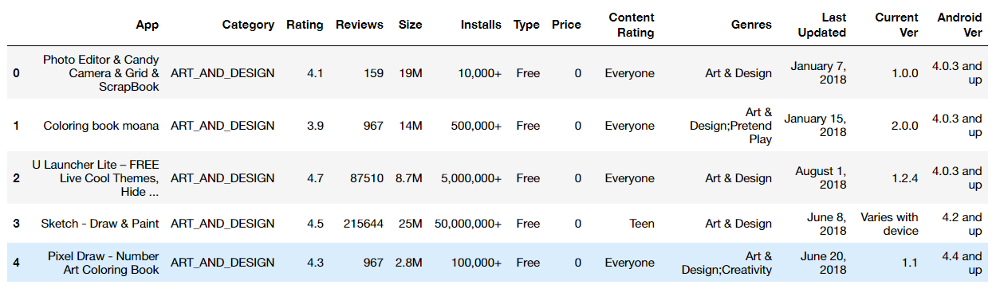

In [45]:
df.dtypes

App                       object
Category                  object
Rating                   float64
Reviews                    int64
Size                     float64
Installs                   int64
Type                      object
Price                    float64
Content_Rating            object
Genres                    object
Last_Updated      datetime64[ns]
Current_Ver               object
Android_Ver               object
dtype: object

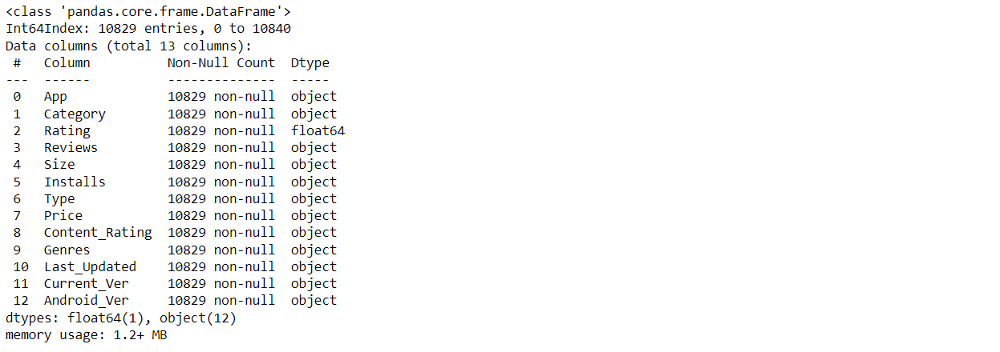

# <p style="background-color:green;font-family:newtimeroman;font-size:150%;color:white;text-align:center;border-radius:20px 20px;"><b>Data Visualization</b></p>
![](https://neilpatel.com/wp-content/uploads/2021/03/Data-Visualization_Featured-Image-1.png)

## <font color='green'><b> Type göre bir bar grafik çizimi</b><font color='black'> 

**Kod Açıklaması**

Bu kod parçası, Type sütunundaki değerlerin (genellikle "Free" ve "Paid") kaç kez tekrar ettiğini gösteren bir bar grafiği çizer. İşte kodun açıklaması:

**type_counts = df['Type'].value_counts():** Bu satır, Type sütunundaki her bir benzersiz değerin kaç kez tekrar ettiğini hesaplar ve bu bilgiyi type_counts değişkenine kaydeder.

**plt.figure(figsize=(15, 10)):** Bu satır, oluşturulacak grafik için boyutu 15x10 olarak ayarlar.

**plt.bar(type_counts.index, type_counts.values, color=['blue', 'orange']):** Bu satır, bar grafiğini çizer. type_counts.index x ekseninde gösterilecek değerlerdir ("Free" ve "Paid"), type_counts.values ise y ekseninde gösterilecek değerlerdir (her bir tür için uygulama sayısı).

**plt.xlabel('Uygulama Türü'), plt.ylabel('Uygulama Sayısı'), plt.title('Uygulama Türüne Göre Uygulama Sayısı'):** Bu satırlar, x ve y eksenlerine etiket ekler ve grafiğe bir başlık verir.

**plt.show():** Bu satır, grafiği gösterir.

Sonuç olarak, bu kod parçası Type sütunundaki değerlerin frekansını gösteren bir bar grafiği oluşturur. Grafikte, "Free" ve "Paid" etiketleri altında, her bir tür için kaç tane uygulama olduğu gösterilir.

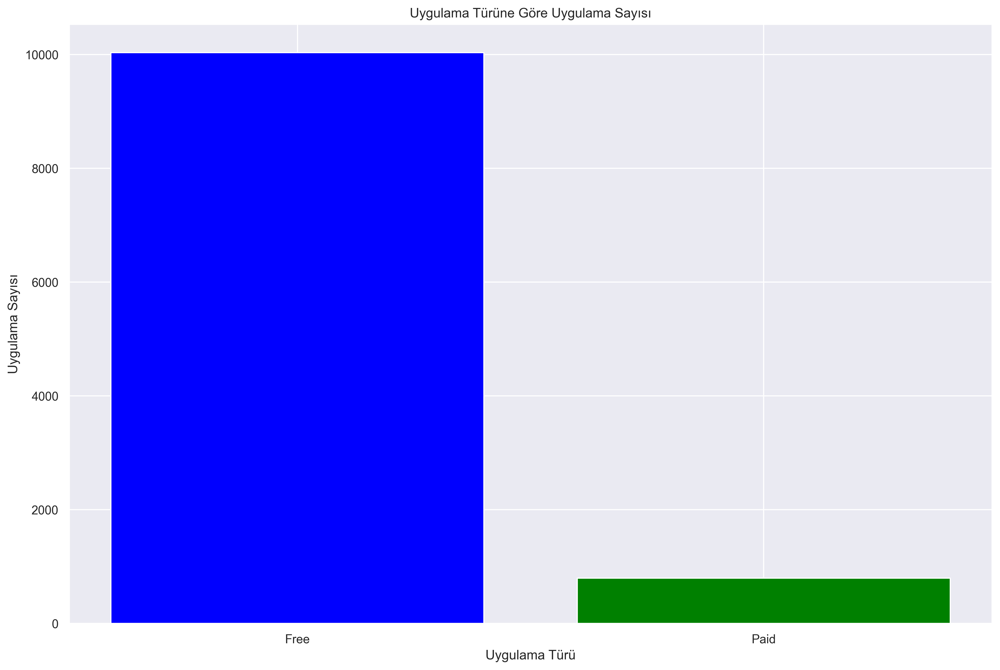

In [46]:
# 'Type' sütunundaki değerlerin sayısını al
type_counts = df['Type'].value_counts()

# Bar grafiği çiz
plt.figure(figsize=(15, 10))  # Grafik boyutunu ayarla
plt.bar(type_counts.index, type_counts.values, color=['blue', 'green'])

# Eksen etiketleri ve başlık
plt.xlabel('Uygulama Türü')
plt.ylabel('Uygulama Sayısı')
plt.title('Uygulama Türüne Göre Uygulama Sayısı')

# Göster
plt.show()

Görüldüğü üzere ücretsiz uygulamalar ücretlilere göre çok fazla sayıdadır.

**Output Açıklaması**

**X Ekseni ("Uygulama Türü"):** Bu eksen, Type sütunundaki benzersiz değerleri gösterir. Genellikle bu değerler "Free" (ücretsiz) ve "Paid" (ücretli) olur. Eğer Type sütununda başka benzersiz değerler de varsa, onlar da bu eksende gösterilecektir.

**Y Ekseni ("Uygulama Sayısı"):** Bu eksen, her bir "Uygulama Türü" için kaç tane uygulama olduğunu gösterir. Örneğin, eğer "Free" değeri 1000 kez tekrar ediyorsa, bu 1000 tane ücretsiz uygulama olduğu anlamına gelir.

Bu iki eksenin kesiştiği noktalar, bar grafiğinin barlarını oluşturur. Her bir barın yüksekliği, o "Uygulama Türü" için kaç tane uygulama olduğunu gösterir. Örneğin, "Free" için yüksek bir bar varsa, bu çoğu uygulamanın ücretsiz olduğunu gösterir. "Paid" için daha düşük bir bar varsa, bu daha az sayıda ücretli uygulama olduğunu gösterir.

## <font color='green'> <b>Box plot for the rating column</b><font color='black'> 

**Kod Açıklaması**

Bu kod parçası, Type sütunundaki her bir benzersiz değer ("Free" ve "Paid") için Rating değerlerinin bir box plot'ını çizer. İşte kodun açıklaması:

**plt.figure(figsize=(15, 10)):** Bu satır, oluşturulacak grafik için boyutu 15x10 olarak ayarlar.

**sns.boxplot(...):** Bu satır, seaborn kütüphanesini kullanarak box plot'u çizer. palette parametresi ile "Free" için mavi ("blue") ve "Paid" için yeşil ("green") renkler ayarlanmıştır.

**plt.xlabel('Uygulama Türü'), plt.ylabel('Rating'), plt.title('Uygulama Türüne Göre Rating Dağılımı'):** Bu satırlar, x ve y eksenlerine etiket ekler ve grafiğe bir başlık verir.

**plt.show():** Bu satır, grafiği gösterir.

Bu grafik, ücretsiz ve ücretli uygulamaların rating dağılımlarını farklı renklerle gösterir, böylece kolayca karşılaştırabilirsiniz.

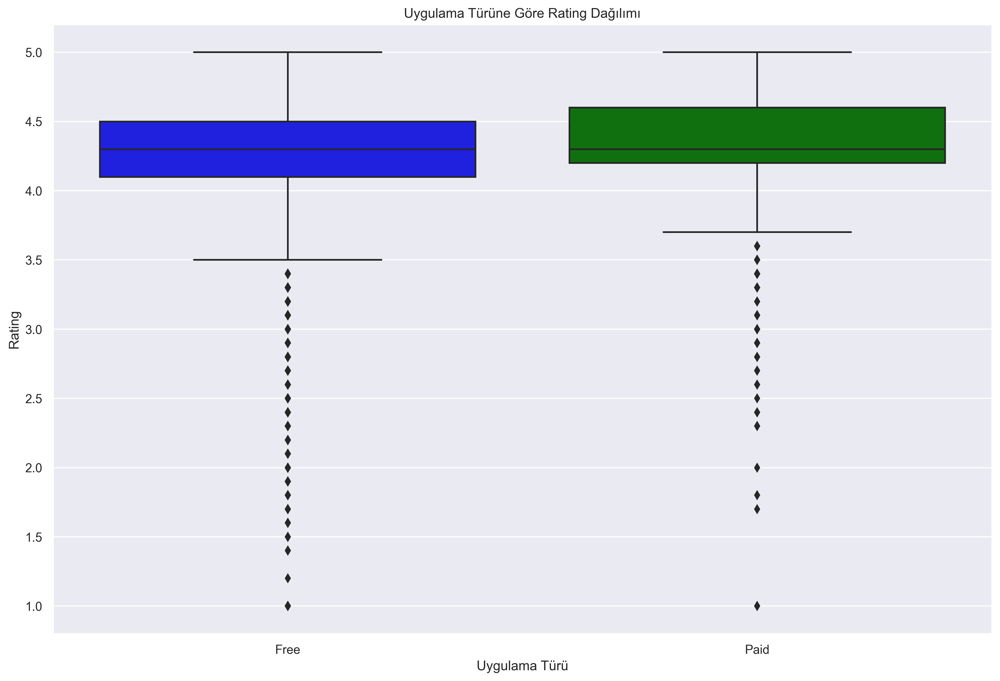

In [47]:
# Grafik boyutunu ayarla
plt.figure(figsize=(15, 10))

# Seaborn kütüphanesi ile box plot çiz ve renkleri ayarla
sns.boxplot(x='Type', y='Rating', data=df.dropna(subset=['Rating', 'Type']), palette={"Free": "blue", "Paid": "green"})

# Eksen etiketleri ve başlık
plt.xlabel('Uygulama Türü')
plt.ylabel('Rating')
plt.title('Uygulama Türüne Göre Rating Dağılımı')

# Göster
plt.show()


Görüldüğü üzere ücretli uygulamaların ortalama puanı daha yüksektir.

**Output Açıklaması**

**X Ekseni ("Uygulama Türü"):** Bu eksen, Type sütunundaki benzersiz değerleri gösterir. Bu örnekte bu değerler "Free" (ücretsiz) ve "Paid" (ücretli) olacaktır. Eğer Type sütununda başka benzersiz değerler de varsa, onlar da bu eksende gösterilecektir.

**Y Ekseni ("Rating"):** Bu eksen, her bir "Uygulama Türü" için Rating değerlerinin dağılımını gösterir. Y eksenindeki sayılar, uygulamaların aldığı puanları temsil eder. Örneğin, 1 ile 5 arasında bir değer olabilir.

box plot'ta gördüğünüz çeşitli kutular ve çizgiler veri dağılımının temel istatistiklerini temsil eder. Terminolojik olarak ne anlama geldikleri ise;

**Alt yatay çizgi (whisker) = Minimum (En Düşük Değer):** Veri setindeki en düşük değeri temsil eder. Ancak, bu çizgi aykırı değerleri (outliers) göz ardı eder.

**Üst yatay çizgi (whisker) = Maksimum (En Yüksek Değer):** Veri setindeki en yüksek değeri temsil eder. Ancak, bu çizgi de aykırı değerleri göz ardı eder.

**Kutunun alt kenarı = İlk Çeyrek (Q1):** Veri setinin ilk çeyreğini (ilk 25%) temsil eder.

**Kutunun üst kenarı = Üçüncü Çeyrek (Q3):** Veri setinin üçüncü çeyreğini (ilk 75%) temsil eder.

**Kutu içindeki yatay çizgi = Medyan (Q2):** Veri setinin medyanını (ortanca değerini) temsil eder.

- **IQR (Interquartile Range):** İlk ve üçüncü çeyrekler arasındaki fark, yani kutunun yüksekliği. IQR, veri dağılımının ne kadar yaygın olduğunu gösterir.

- **Aykırı Değerler (Outliers):** Üst ve alt yatay çizgilerin dışında kalan noktalar, aykırı değerleri temsil eder.

- **Kutu (Box):** İlk çeyrek (Q1) ve üçüncü çeyrek (Q3) arasındaki alanı temsil eder ve veri setinin merkezi dağılımını gösterir.

Bu grafik, ücretsiz ve ücretli uygulamaların rating dağılımlarını karşılaştırmanıza olanak tanır. Örneğin, ücretsiz uygulamaların rating'leri genellikle daha mı yüksek, yoksa ücretli uygulamalar mı daha yüksek puan alıyor, gibi sorulara cevap arayabilirsiniz. Ayrıca, aykırı değerlerin varlığı da gözlemlenebilir.

## NOT

Eğer aklınıza whisker dışında olan değerlerin neden minimum veya maksimum olarak kabul edilmediği gibi bir soru gelirse bunun bilgisi için aşağıdaki not size cevap olacaktır.

- Box plot'ta gösterilen "minimum" ve "maksimum" değerler, aslında aykırı değerleri (outliers) göz ardı eden "whisker"lar olarak adlandırılır. Yani, bu çizgiler veri setinin çoğunu kapsayan, ancak aykırı değerleri hariç tutan değer aralığını gösterir.

- Bu "whisker"lar genellikle IQR (interquartile range, yani Q3 - Q1) kullanılarak hesaplanır. Örneğin, alt whisker genellikle "Q1 - 1.5 * IQR" formülü ile ve üst whisker "Q3 + 1.5 * IQR" formülü ile hesaplanır. Bu formüller, veri dağılımının genel yapısını yansıtmak için tasarlanmıştır ve aykırı değerleri dışarıda bırakmayı amaçlar.

- Bu nedenle, box plot'ta gösterilen "minimum" ve "maksimum" değerler, tüm veri setinin en düşük ve en yüksek değerleri değildir. Bunun yerine, bu değerler veri setinin çoğunu temsil eden ve aykırı değerleri hariç tutan bir aralığı gösterir.

- Bu konuyu öğrencilere açıklarken, box plot'un veri setinin "tipik" bir aralığını göstermek için tasarlandığını, ancak aykırı değerleri de göz önünde bulundurduğunu belirtebilirsiniz. Yani, box plot hem merkezi eğilimi (medyan, çeyrekler) hem de veri dağılımının yayılımını (IQR, aykırı değerler) bir arada gösterir.

## <font color='green'><b> Kategori sayısı ile Rating sütunu için Bar grafik çizimi</b><font color='black'> 

**Kod Açıklaması**

**plt.figure(figsize=(15, 10)):** Matplotlib kütüphanesini kullanarak oluşturulacak grafik için boyutu ayarlar. Genişlik 15 birim, yükseklik 10 birim olarak belirlenmiştir.

**sns.countplot(x="Rating", data=df):** Seaborn kütüphanesinin countplot fonksiyonu ile "Rating" sütunundaki değerlerin sayısını gösteren bir dikey bar plot çizer. x parametresi ile hangi sütunun kullanılacağı belirlenir, data parametresi ile de veri çerçevesi belirlenir.

**plt.title("Puan Kategorileri ve Sayıları"):** Grafik başlığını ayarlar.

**plt.xlabel("Rating Kategorileri") ve plt.ylabel("Uygulama Sayısı"):** X ve Y eksenlerinin etiketlerini ayarlar.

**plt.show():** Grafiki ekrana çizer.

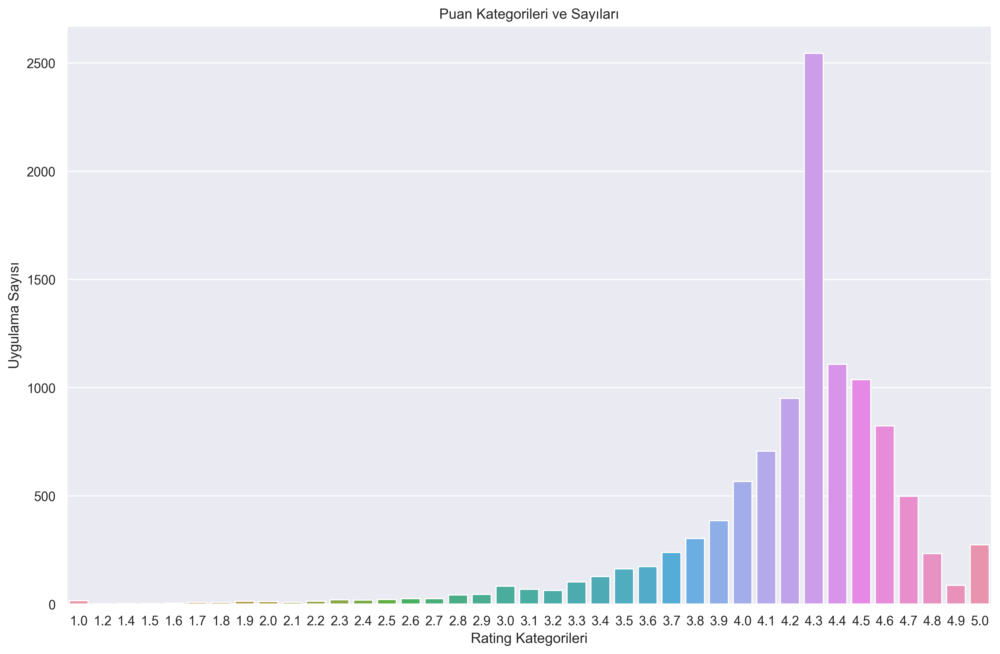

In [48]:
# Grafik boyutunu ayarla
plt.figure(figsize=(14,9))

# Seaborn ile dikey bar plot çiz
sns.countplot(x="Rating", data=df) #Sıralamak için , order=df['Rating'].value_counts().sort_index().index

# Grafik başlığı
plt.title("Puan Kategorileri ve Sayıları")

# Eksen etiketleri
plt.xlabel("Rating Kategorileri")
plt.ylabel("Uygulama Sayısı")

# Grafik gösterimi
plt.show()

**Kod Açıklaması**

**plt.figure(figsize=(15, 10)):** Grafik boyutunu ayarlar.

**sns.countplot(y="Content_Rating", data=df, order = df['Content_Rating'].value_counts().index):** "Content_Rating" sütunundaki değerlerin sayısını gösteren bir yatay bar plot çizer. y parametresi ile hangi sütunun kullanılacağı belirlenir. order parametresi ile bar'lar en yüksek sayıdan en düşüğe doğru sıralanır.

**plt.title("İçerik Derecelendirmeleri ve Sayıları"):** Grafik başlığını ayarlar.

**plt.xlabel("Uygulama Sayısı") ve plt.ylabel("Content Rating"):** X ve Y eksenlerinin etiketlerini ayarlar.

**plt.show():** Grafiki ekrana çizer.

Bu kod parçaları, belirli sütunlardaki kategorilerin sayısını görselleştirmek için kullanılır. Bu sayede, hangi kategorilerin daha yaygın olduğu hakkında hızlı bir fikir edinebiliriz.

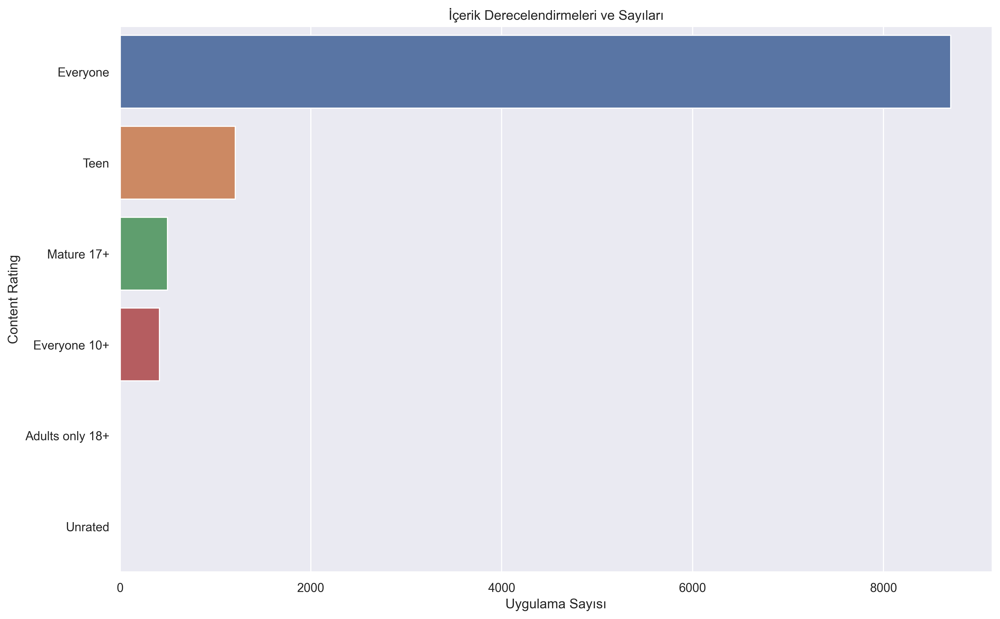

In [49]:
# Grafik boyutunu ayarla
plt.figure(figsize=(14, 9))

# Seaborn ile yatay bar plot çiz
sns.countplot(y="Content_Rating", data=df, order = df['Content_Rating'].value_counts().index)

# Grafik başlığı
plt.title("İçerik Derecelendirmeleri ve Sayıları")

# Eksen etiketleri
plt.xlabel("Uygulama Sayısı")
plt.ylabel("Content Rating")

# Grafik gösterimi
plt.show()

Gördüğünüz gibi, en çok uygulama Everyone kategorisinde yer alıyor, ardından Teen geliyor.

## <font color='green'> <b>Content rating ve Rating için Box Plot grafiği</b><font color='black'>

**Kod Açıklaması**

Bu kod parçası, "Content_Rating" ve "Rating" sütunları arasındaki ilişkiyi gösteren bir box plot çizer. 

**plt.figure(figsize=(15, 10)):** Grafik boyutunu ayarlar. Genişlik 15 birim, yükseklik 10 birim olarak belirlenmiştir. (Bu satır kodda eksik, eğer eklemek isterseniz.)

**sns.boxplot(x = "Content_Rating", y = "Rating", data = df):** Seaborn kütüphanesinin boxplot fonksiyonu ile "Content_Rating" sütunundaki kategorilere göre "Rating" sütununun dağılımını gösteren bir box plot çizer. x ve y parametreleri ile hangi sütunların kullanılacağı belirlenir, data parametresi ile de veri çerçevesi belirlenir.

**plt.title("The content rating & rating", size=20):** Grafik başlığını ve başlık boyutunu ayarlar.

Bu grafik, farklı "Content_Rating" kategorileri (örneğin, "Everyone", "Teen" vb.) için "Rating" değerlerinin nasıl dağıldığını gösterir. Bu sayede, farklı içerik derecelendirmelerine sahip uygulamaların puanlarının nasıl bir dağılım gösterdiğini anlayabiliriz.

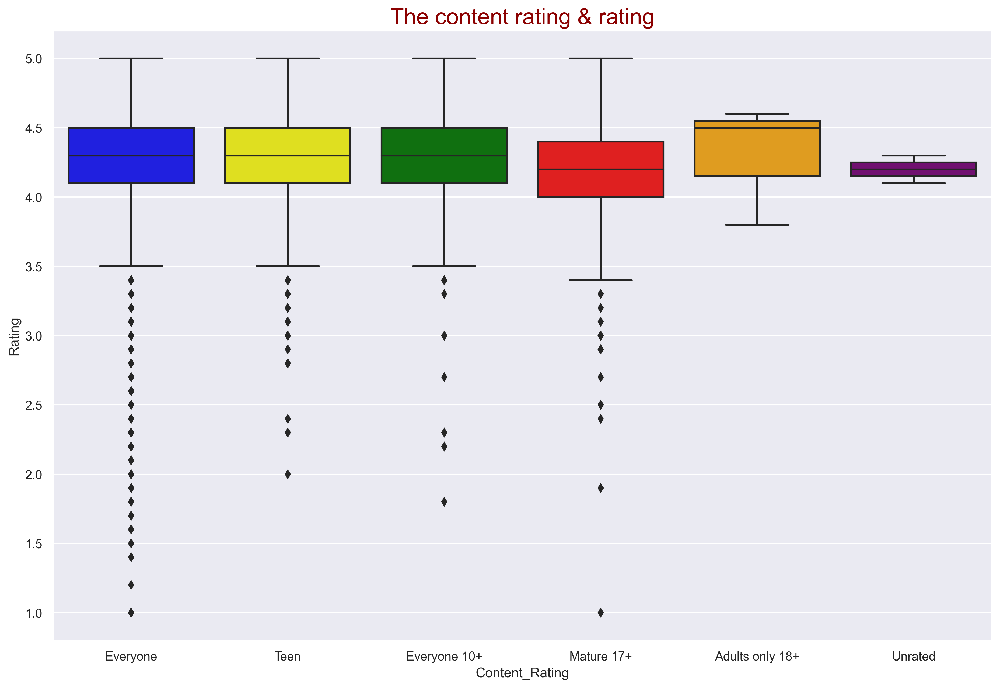

In [50]:
# Grafik boyutunu ayarla
plt.figure(figsize=(15, 10))

# Seaborn ile box plot çiz
# 'x' ve 'y' parametreleri ile hangi sütunların kullanılacağı belirlenir
# 'data' parametresi ile de veri çerçevesi belirlenir
# 'palette' parametresi ile her bir "Content_Rating" kategorisi için renkler belirlenir
sns.boxplot(x="Content_Rating", y="Rating", data=df, palette={"Everyone": "blue", 
                                                              "Teen": "yellow", 
                                                              "Everyone 10+": "green",
                                                              "Mature 17+": "red",
                                                              "Adults only 18+": "orange",
                                                              "Unrated": "purple"})

# Grafik başlığı ve başlık özellikleri
# 'fontdict' parametresi ile başlık için bir sözlük belirlenir
# 'fontsize' anahtarı ile başlık boyutunu 20 olarak, 'color' anahtarı ile de başlık rengini 'darkred' olarak ayarlar
plt.title("The content rating & rating", fontdict={'fontsize': 20, 'color': 'darkred'})

# Grafik gösterimi
plt.show()


**Output Açıklaması**

Gördüğünüz gibi, Rating Everyone, Teen ve Everyone 10+ için neredeyse aynı. Everyone'ın diğer kategorilere göre daha fazla aykırı (outlier) değeri var. Mature 17+ en düşük ortalamaya sahipken Adults only 18+ kategorisinin reyting ortalaması diğerlerinden daha yüksektir.

## <font color='green'> <b>Kategori sayısı ile kategori sütunu için çubuk grafiği</b><font color='black'>

**Kod Açıklaması**

**plt.figure(figsize=(15, 10)):** Matplotlib kütüphanesini kullanarak oluşturulacak grafik için boyutu ayarlar. Genişlik 15 birim, yükseklik 10 birim olarak belirlenmiştir.

**sns.countplot(y="Category", data=df, order=df['Category'].value_counts().index):** Seaborn kütüphanesinin countplot fonksiyonu ile "Category" sütunundaki değerlerin sayısını gösteren bir yatay bar plot çizer. y parametresi ile hangi sütunun kullanılacağı belirlenir, data parametresi ile de veri çerçevesi belirlenir. order parametresi ile bar'lar en yüksek sayıdan en düşüğe doğru sıralanır.

**plt.title("Kategoriye Göre Uygulama Sayıları", fontdict={'fontsize': 20, 'color': 'darkred'}):** Grafik başlığını ve başlık boyutunu ayarlar. fontdict parametresi ile başlık için bir sözlük belirlenir. fontsize anahtarı ile başlık boyutunu 20 olarak, color anahtarı ile de başlık rengini 'darkred' olarak ayarlar.

**plt.xlabel("Uygulama Sayısı") ve plt.ylabel("Kategoriler"):** X ve Y eksenlerinin etiketlerini ayarlar.

**plt.show():** Grafiki ekrana çizer.

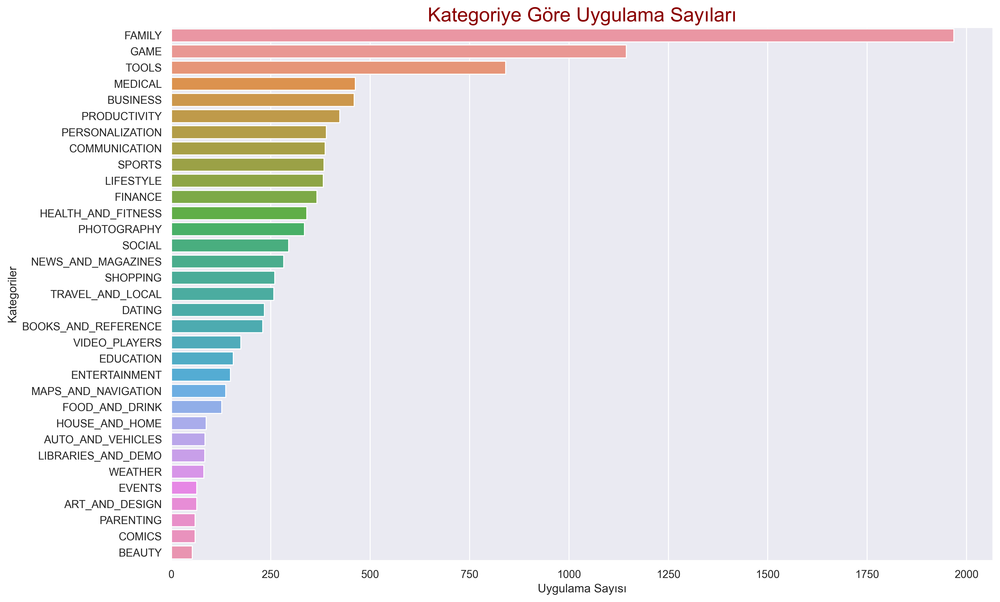

In [51]:
# Grafik boyutunu ayarla
plt.figure(figsize=(15, 10))

# Seaborn ile yatay bar plot çiz. y dersem y eksenini kullanacağından yatay bir bar plot çizecektir.
# 'y' parametresi ile hangi sütunun kullanılacağı belirlenir, 'data' parametresi ile de veri çerçevesi belirlenir
sns.countplot(y="Category", data=df, order=df['Category'].value_counts().index)

# Grafik başlığı ve başlık özellikleri
plt.title("Kategoriye Göre Uygulama Sayıları", fontdict={'fontsize': 20, 'color': 'darkred'})

# Eksen etiketleri
plt.xlabel("Uygulama Sayısı")
plt.ylabel("Kategoriler")

# Grafik gösterimi
plt.show()


En çok uygulama Family (aile), sonra Game (oyun), sonra da Tools (araçlar) kategorisindedir.

## <font color='coral'> <b>Scatter plot for the category and price</b><font color='black'>

**Kod Açıklaması**

Bu kod parçası, Seaborn ve Matplotlib kütüphanelerini kullanarak bir scatter plot (saçılım grafiği) oluşturur.

**import seaborn as sns, import matplotlib.pyplot as plt:** Seaborn ve Matplotlib kütüphanelerini içe aktarır. Bu kütüphaneler, veri görselleştirme için kullanılır.

**plt.figure(figsize=(15, 10)):** Matplotlib ile oluşturulacak grafik için boyutları ayarlar. Bu durumda, grafik boyutu 15x10 birim olacaktır.

**sns.scatterplot(x='Reviews', y='Rating', data=df):** Seaborn'un scatterplot fonksiyonu ile "Reviews" (Yorum Sayısı) ve "Rating" (Puan) sütunları arasında bir saçılım grafiği çizer.

**x='Reviews':** X ekseninde gösterilecek veri sütunu ("Reviews").
**y='Rating':** Y ekseninde gösterilecek veri sütunu ("Rating").
**data=df:** Kaynak veri çerçevesi.
**plt.title("Yorum Sayısı ve Puan İlişkisi", fontdict={'fontsize': 20, 'color': 'darkred'}):** Grafik için bir başlık ekler ve başlığın font boyutu ile rengini ayarlar.

**plt.xlabel("Yorum Sayısı"), plt.ylabel("Puan"):** X ve Y eksenleri için etiketler ekler.

**plt.show():** Oluşturulan grafiki ekranda gösterir.

Bu grafik, "Reviews" ve "Rating" sütunları arasındaki ilişkiyi görselleştirir. Yani, bir uygulamanın aldığı yorum sayısı ile puanı arasında nasıl bir ilişki olduğunu görmemizi sağlar. Eğer iki değişken arasında belirgin bir trend varsa, bu grafik sayesinde gözlemleyebiliriz.

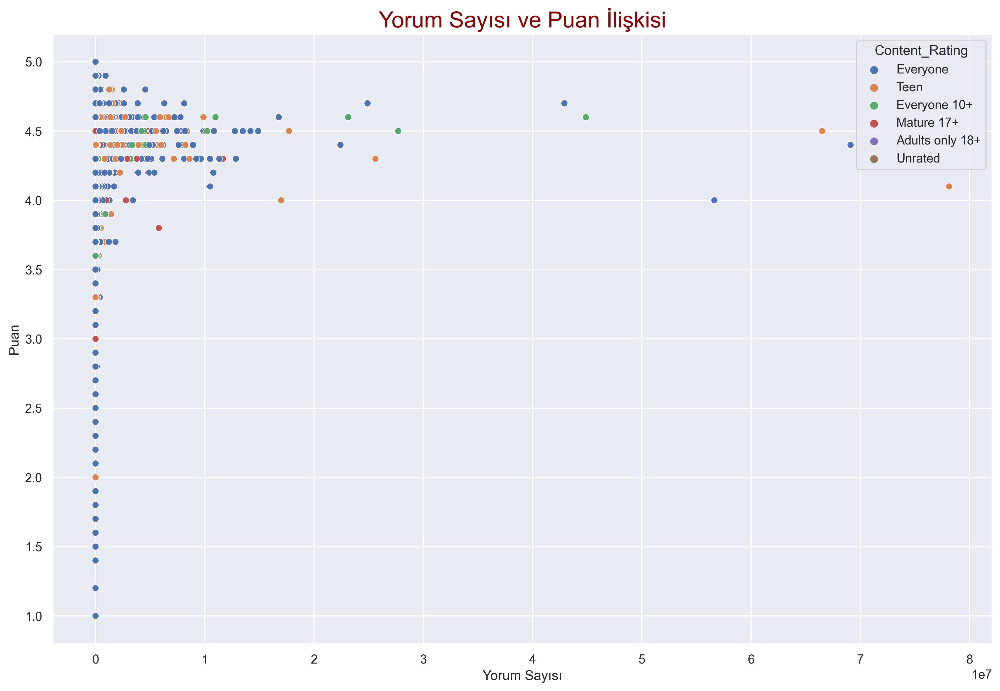

In [52]:
# Grafik boyutunu ayarla
plt.figure(figsize=(15, 10))

# Seaborn ile scatter plot çiz
sns.scatterplot(x='Reviews', y='Rating', data=df, hue='Content_Rating')

# Grafik başlığı ve başlık özellikleri
plt.title("Yorum Sayısı ve Puan İlişkisi", fontdict={'fontsize': 20, 'color': 'darkred'})

# Eksen etiketleri
plt.xlabel("Yorum Sayısı")
plt.ylabel("Puan")

# Grafik gösterimi
plt.show()

**Kod Açıklaması**

Bu kod parçası, Seaborn kütüphanesi kullanarak bir pairplot (çiftler grafiği) oluşturur. Bu grafik, belirtilen sayısal değişkenler (Rating', 'Reviews', 'Size', 'Installs', 'Price') arasındaki ilişkileri görselleştirir. Ayrıca, hue='Category' parametresi ile bu ilişkilerin Category sütunundaki kategorilere (örneğin, "ART_AND_DESIGN", "BUSINESS" vb.) göre nasıl değiştiği gösterilir.

**sns.set(rc={"figure.figsize":(15, 10)}):** Seaborn'un grafik boyutunu ayarlar. Bu durumda, her grafik 15x10 birim boyutunda olacaktır.

**sns.pairplot(df[[Rating', 'Reviews', 'Size', 'Installs', 'Price', 'Category']].dropna(), hue='Category'):** Seaborn'un pairplot fonksiyonu ile belirtilen sütunlar için çiftler grafiği oluşturulur.

**df[[Rating', 'Reviews', 'Size', 'Installs', 'Price', 'Category']].dropna():** Veri çerçevesinden belirtilen sütunlar seçilir ve eksik değerler (NaN) kaldırılır.

**hue='Category':** Grafiklerin "Category" sütununa göre renklendirilmesini sağlar. Yani, her bir "Category" kategorisi için farklı bir renk kullanılır.

**plt.show():** Oluşturulan grafikleri gösterir.

Bu pairplot, seçilen sayısal değişkenlerin birbiriyle olan ilişkisini görselleştirir. Aynı zamanda, hue parametresi sayesinde, bu ilişkilerin "Content_Rating" sütunundaki kategorilere göre nasıl değiştiğini gözlemlememize olanak tanır. Örneğin, "Everyone" ve "Teen" kategorileri için "Rating" ve "Reviews" arasındaki ilişki farklı olabilir. Bu tür görselleştirmeler, veri analizi sırasında önemli içgörüler elde etmeye yardımcı olabilir.

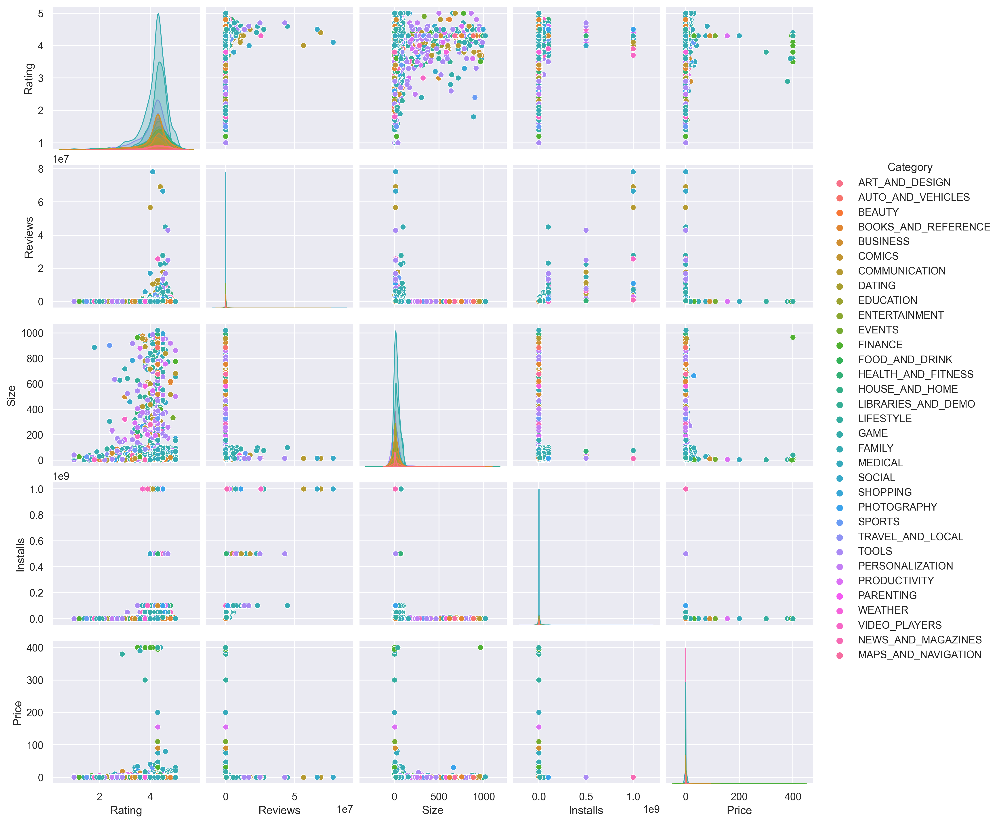

In [53]:
# Grafik boyutunu ayarla
sns.set(rc={"figure.figsize":(15, 10)})

# Seaborn ile pairplot çiz
# 'hue' parametresi ile grafiklerin hangi kategorik sütuna göre renklendirileceği belirlenir
sns.pairplot(df[['Rating', 'Reviews', 'Size', 'Installs', 'Price', 'Category']].dropna(), hue='Category')

# Grafik gösterimi
plt.show()

**Output Açıklaması**

**Diagonal (Köşegen) Grafikler:** Köşegen üzerindeki grafikler, her bir değişkenin dağılımını gösterir. Bu dağılımlar, değişkenin nasıl bir yapıya sahip olduğu hakkında fikir verir.

**Diğer Grafikler:** Köşegen dışındaki grafikler, iki farklı değişken arasındaki ilişkiyi gösterir. Örneğin, Rating ve Reviews arasındaki grafik, yorum sayısı arttıkça puanın nasıl değiştiğini gösterir.

**Renkler: hue='Category'** parametresi sayesinde, farklı Category kategorileri farklı renklerle gösterilir. Bu, aynı grafik üzerinde farklı kategoriler arasındaki ilişkileri de gözlemlememizi sağlar.

**Sayısal Değişkenler:** Grafikte görselleştirilen sayısal değişkenler (Rating, Reviews, Installs, Size, Price), birbiriyle nasıl bir ilişki içerisinde olduklarına dair ipuçları verir.

Bu tür bir grafik, özellikle veri keşfi aşamasında, değişkenler arasındaki ilişkileri hızlı bir şekilde gözlemlemek için oldukça yararlıdır. Ancak, grafikte çok fazla veri noktası veya kategori varsa, görselleştirme karmaşık ve yorumlaması zor olabilir.

**Kod Açıklaması**

Bu kod parçası, Google Play Store'da en çok harcama yapılan 5 kategoriyi gösteren bir bar grafiği çizmek için kullanılır.

**total_spending_by_category = df.groupby('Category')['Price'].sum().sort_values(ascending=False): Kategorilere göre toplam harcamayı hesapla:** 'Category' sütununa göre gruplayarak, her kategoride ne kadar toplam harcama yapıldığını hesaplıyoruz.

**top5_categories = total_spending_by_category.nlargest(5): En çok harcama yapılan 5 kategoriyi seç:** Toplam harcamaları büyükten küçüğe sıralayarak en çok harcama yapılan 5 kategoriyi seçiyoruz.

**plt.figure(figsize=(15, 10)): Bar grafiği çiz:** Seçilen 5 kategoriyi ve bu kategorilere yapılan toplam harcamayı gösteren bir bar grafiği çiziyoruz. Grafiğin boyutunu (15, 10) olarak ayarlıyoruz.

**plt.xlabel('Kategori')
plt.ylabel('Toplam Harcama')
plt.title('En Çok Harcama Yapılan 5 Kategori')
Eksen etiketleri ve başlık:** X eksenine 'Kategori' ve Y eksenine 'Toplam Harcama' etiketlerini ekliyoruz. Grafiğin başlığı olarak 'En Çok Harcama Yapılan 5 Kategori'yi kullanıyoruz.

**plt.show(): Göster:** Grafiği ekranda gösteriyoruz.

Bu grafik, en çok harcama yapılan 5 kategoriyi ve bu kategorilere ne kadar toplam harcama yapıldığını görsel bir şekilde sunar.

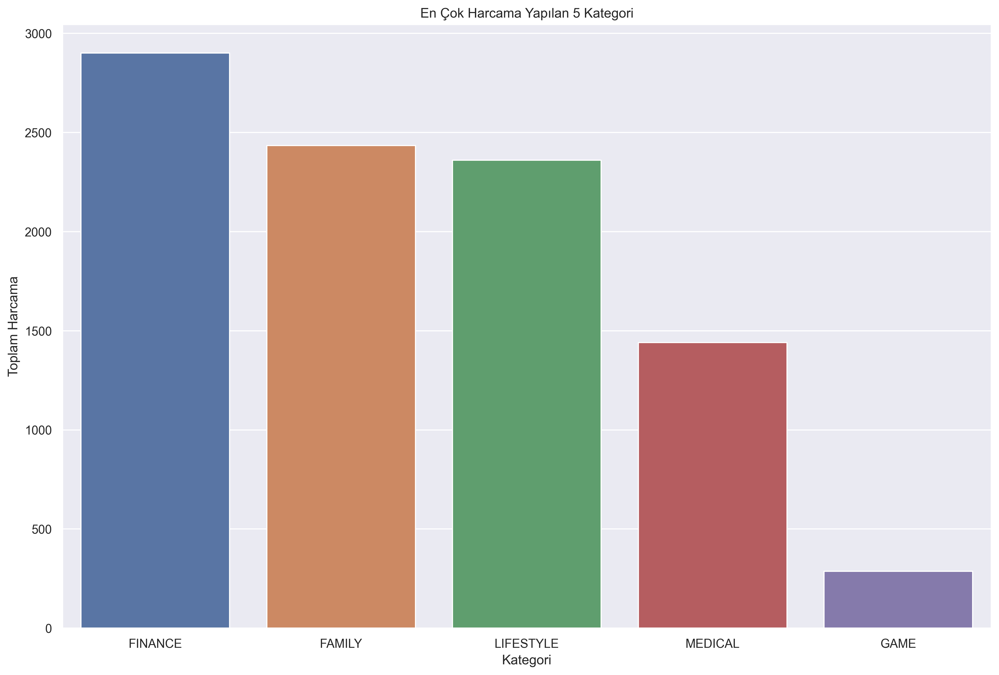

In [54]:
# Kategorilere göre toplam harcamayı hesapla
total_spending_by_category = df.groupby('Category')['Price'].sum().sort_values(ascending=False)

# En çok harcama yapılan 5 kategoriyi seç
top5_categories = total_spending_by_category.nlargest(5)

# Bar grafiği çiz
plt.figure(figsize=(15, 10))
sns.barplot(x=top5_categories.index, y=top5_categories.values, order=top5_categories.index)

# Eksen etiketleri ve başlık
plt.xlabel('Kategori')
plt.ylabel('Toplam Harcama')
plt.title('En Çok Harcama Yapılan 5 Kategori')

# Göster
plt.show()


Bu kod parçasının çıktısı, Google Play Store'da en çok harcama yapılan 5 kategoriyi ve bu kategorilere ne kadar toplam harcama yapıldığını gösteren bir bar grafiği olacaktır. Grafikte yatay eksende kategoriler, dikey eksende ise toplam harcama miktarı yer alacaktır.

**Yatay Eksen (X Eksen):** Burada en çok harcama yapılan 5 kategori ismi yer alır. Kategoriler, en çok harcamadan en aza doğru sıralanmıştır.

**Dikey Eksen (Y Eksen):** Bu eksen, her bir kategori için yapılan toplam harcamayı gösterir. Değerler dolar cinsindendir.

**Barlar:** Her bir bar, bir kategoriyi temsil eder ve barın yüksekliği, o kategoride ne kadar toplam harcama yapıldığını gösterir.

**Başlık:** Grafikte 'En Çok Harcama Yapılan 5 Kategori' başlığı yer alır, bu da grafiğin neyi temsil ettiğini açıkça belirtir.

Bu grafik, hangi kategorilerin kullanıcılar tarafından daha fazla para harcanarak indirildiğini anlamak için oldukça yararlıdır. Örneğin, eğer 'Oyunlar' kategorisi en yüksek toplam harcamaya sahipse, bu oyun uygulamalarının kullanıcılar tarafından daha fazla satın alındığını gösterir.

Görüldüğü üzere en fazla ödeme yapılarak alınan uygulamalar Finans a ait. Kısaca insanlar kaz gelecek yerden tavuk esirgemiyorlar:))

## <font color='green'> <b>Nümerik Columnlar için Heatmap Çizelim</b><font color='black'>

**Kod Açıklaması**

**plt.figure(figsize=(15, 10)):** Matplotlib kütüphanesini kullanarak oluşturulacak grafik için boyutları ayarlıyoruz. Bu durumda, grafik boyutu 15x10 birim olacak.

**sns.heatmap(df.corr(), annot=True, linewidths=.5, fmt=".2f", cmap='coolwarm', cbar_kws={"shrink": .75}):** Seaborn kütüphanesinin heatmap fonksiyonu ile bir ısı haritası (heatmap) çiziyoruz.

**df.corr():** Veri çerçevesinin sayısal sütunları arasındaki korelasyon matrisini hesaplıyor.
**annot=True:** Her bir hücre için korelasyon katsayısını gösteriyor.
**linewidths=.5:** Hücreler arasındaki çizgilerin kalınlığını ayarlıyor.
**fmt=".2f":** Sayıların formatını belirtiyor; bu durumda iki ondalık basamağa kadar gösterilecek.
**cmap='coolwarm':** Renk paletini "coolwarm" olarak ayarlıyor.
**cbar_kws={"shrink": .75}:** Renk çubuğunun boyutunu %75 oranında küçültüyor.
**plt.title("Sayısal Sütunlar için Heatmap", fontdict={'fontsize': 20, 'color': 'darkred'}):** Grafik için bir başlık ekliyoruz ve başlığın font boyutunu ve rengini ayarlıyoruz.

**plt.show():** Grafiki ekranda gösteriyoruz.

Bu kod parçası, veri çerçevesindeki sayısal sütunlar arasındaki korelasyonu görselleştiren bir ısı haritası oluşturur. Isı haritası, farklı sütunlar arasındaki ilişkinin ne kadar güçlü veya zayıf olduğunu anlamamıza yardımcı olur.

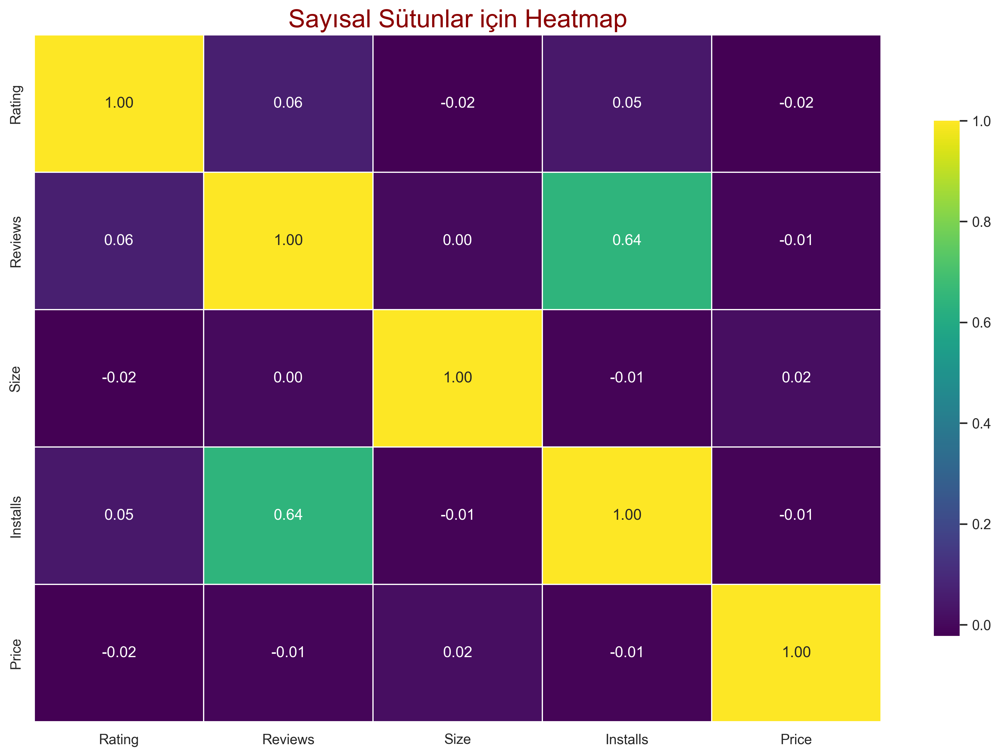

In [55]:
# Grafik boyutunu ayarla
plt.figure(figsize=(15, 10))

# Seaborn ile heatmap çiz
sns.heatmap(df.corr(), annot=True, linewidths=0.5, fmt=".2f", cmap='viridis', cbar_kws={"shrink": .75})

# Grafik başlığı ve başlık özellikleri
plt.title("Sayısal Sütunlar için Heatmap", fontdict={'fontsize': 20, 'color': 'darkred'})

# Grafik gösterimi
plt.show()

Görüldüğü üzere Kullanıcılar tarafından uygulamanın aldığı toplam yorum sayısı (Reviews) ile Uygulamanın Google Play'den kaç kez indirildiği bilgisi (Installs) arasında 0,64 pozitif korelsayon var.

- Korelasyon, iki değişken arasındaki ilişkinin yönünü ve gücünü ölçer. Korelasyon katsayısı genellikle -1 ile 1 arasında bir değer alır.

- -1'e yakın bir korelasyon, iki değişken arasında güçlü bir negatif ilişki olduğunu gösterir.
- 1'e yakın bir korelasyon, iki değişken arasında güçlü bir pozitif ilişki olduğunu gösterir.
- 0'a yakın bir korelasyon, iki değişken arasında zayıf bir ilişki olduğunu gösterir.
- Bu durumda, "Reviews" (Yorum Sayısı) ve "Installs" (İndirilme Sayısı) arasında 0,64 değerinde orta seviyede bir pozitif korelasyon (ilişki) olduğu söyelenebilir. Yani, genellikle bir uygulamanın yorum sayısı arttıkça, indirilme sayısının da artması beklenir.
- Ancak, bu bir nedensellik ilişkisi değildir; yani yorum sayısının artması indirilme sayısını artırmaz, sadece iki değişken arasında bir ilişki olduğunu gösterir.

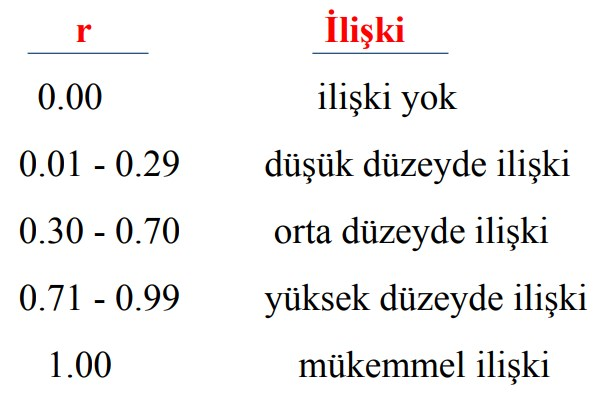

## <font color='green'> <b>Rating Column una göre KDE içeren bir Histogram grafiği çizelim </b><font color='black'>

Bu kod parçası, Google Play Store'da yer alan uygulamaların puan dağılımını gösteren bir histogram ve yoğunluk tahmini (KDE - Kernel Density Estimation) grafiği çizmek için kullanılır. İşte kodun ayrıntılı açıklamaları:

**Grafik Boyutunu Ayarla: plt.figure(figsize=(15, 10))** ile grafiğin boyutunu (15, 10) olarak ayarlıyoruz.

**Histogram ve KDE Çiz: sns.histplot()** fonksiyonu ile 'Rating' sütunundan eksik değerler (dropna()) çıkarıldıktan sonra bir histogram ve KDE grafiği çiziyoruz. bins=30 ile 30 kutu (bar) kullanıyoruz. kde=True ile yoğunluk tahmini grafiği de ekleniyor.

**Grafik Başlığı ve Başlık Özellikleri: plt.title()** ile grafiğe "Uygulama Puan Dağılımı" başlığını ekliyoruz ve font büyüklüğü ile rengini ayarlıyoruz.

**Eksen Etiketleri: plt.xlabel() ve plt.ylabel()** ile X ve Y eksenlerine "Puan" ve "Frekans" etiketleri ekleniyor.

**X Eksenindeki Etiketleri Özelleştir: plt.xticks(np.arange(0, 5.1, 0.1),  rotation=90)** ile X eksenindeki etiketler 0'dan 5'e kadar 0.1'lik adımlarla yerleştiriliyor ve bu yazıların karışık gözükmemesi için 90 derecelik açı ile daha anlaşılır yapıyoruz.

**Grafik Gösterimi: plt.show()** ile grafiği ekranda gösteriyoruz.

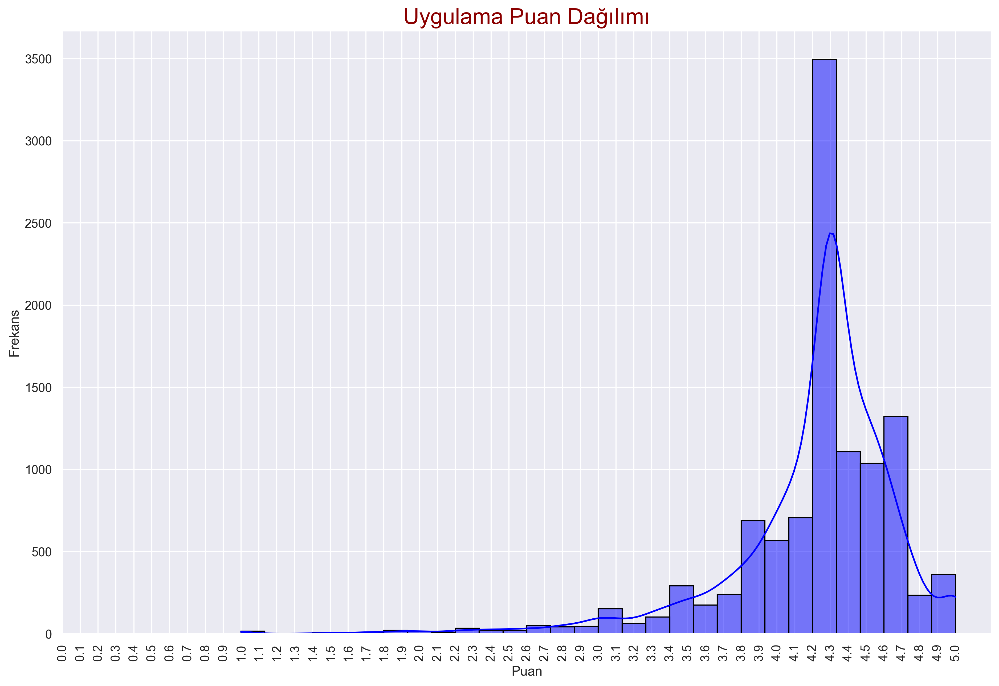

In [56]:
# Grafik boyutunu ayarla
plt.figure(figsize=(15, 10))

# Seaborn ile histogram ve KDE çiz
sns.histplot(df['Rating'], bins=30, kde=True, color='blue', edgecolor='black')

# Grafik başlığı ve başlık özellikleri
plt.title("Uygulama Puan Dağılımı", fontdict={'fontsize': 20, 'color': 'darkred'})

# Eksen etiketleri
plt.xlabel("Puan")
plt.ylabel("Frekans")

# X eksenindeki etiketleri özelleştir
plt.xticks(np.arange(0, 5.1, 0.1), rotation=90)

# Grafik gösterimi
plt.show()

Görüldüğü üzere 

**Histogram:** Her bir bar (kutu), belirli bir puan aralığındaki uygulama sayısını (frekansı) gösterir.

**KDE:** Mavi çizgi, puan dağılımının yoğunluk tahminini gösterir. Bu, hangi puan aralığının daha sık olduğunu anlamamıza yardımcı olur.

**X Ekseni:** Uygulamaların aldığı puanlar (0 ile 5 arasında).

**Y Ekseni:** Her bir puan aralığındaki uygulama sayısı (frekans).

Bu grafik, uygulamaların genellikle hangi puan aralıklarında yoğunlaştığını görmemize yardımcı olur.

**Histogram:**
Histogram, bir veri setindeki değerlerin dağılımını görselleştirmek için kullanılır. Veri seti belirli aralıklara (genellikle eşit büyüklükte) bölünür ve her bir aralıkta kaç veri noktası olduğu sayılır. Bu sayede, veri setinin genel yapısını daha iyi anlayabiliriz.

Örneğin, 4.3 puanında bir artış görmek, bu puan aralığındaki uygulama sayısının diğer puan aralıklarına göre daha fazla olduğunu gösterir. Yani, kullanıcılar genellikle bu puanı daha sık vermişler.

**KDE (Kernel Density Estimation):**
KDE, bir veri setinin olasılık yoğunluk fonksiyonunu tahmin etmek için kullanılır. Basitçe söylemek gerekirse, KDE bize veri setindeki her bir noktanın etrafında bir "yoğunluk" oluşturur ve bu yoğunlukları toplar. Sonuç olarak, daha pürüzsüz bir dağılım grafiği elde edilir.

Histogramda 4.3 puanında bir artış görmek ve KDE grafiğinde de bu puan etrafında bir "tepe" oluşması, bu puanın veri setinde sıkça rastlanan bir değer olduğunu gösterir. Yani, bu puan aralığındaki uygulamaların sayısı diğer puanlara göre daha fazladır ve kullanıcılar bu puanı daha sık vermişlerdir.

Bu iki gözlem bir araya getirildiğinde, uygulamaların genellikle 4.3 puan gibi yüksek puanlar aldığını ve bu puanın kullanıcılar tarafından sıkça verildiğini söyleyebiliriz.

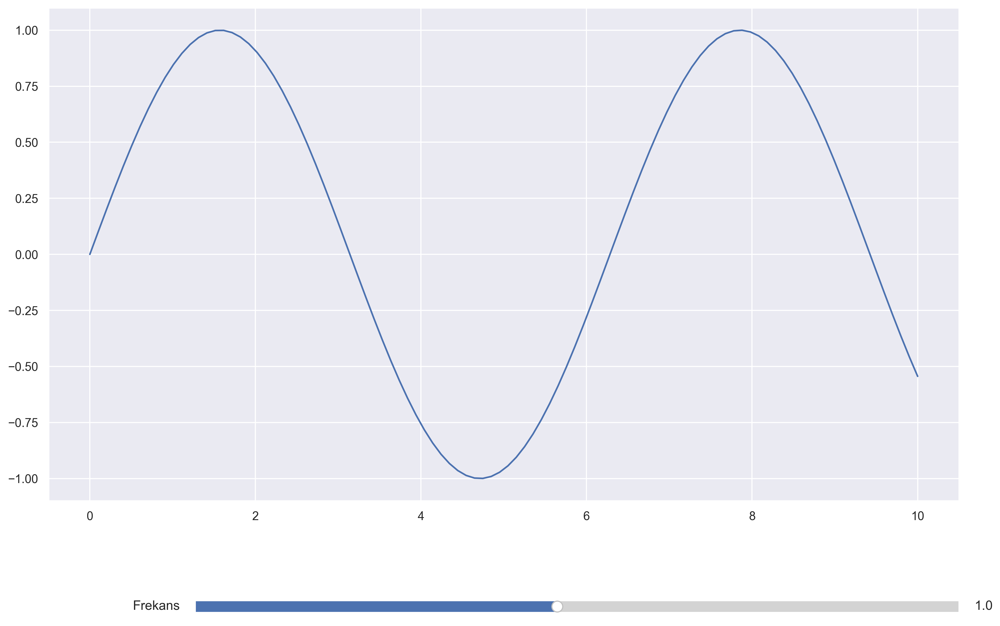

In [57]:
# Veri oluştur
x = np.linspace(0, 10, 100)
y = np.sin(x)

# Ana grafik ve slider için yer ayır
fig, ax = plt.subplots()
plt.subplots_adjust(bottom=0.25)
ax.plot(x, y, label='Sinüs Dalgası')

# Slider'ın yerini ve boyutunu belirle
ax_slider = plt.axes([0.25, 0.1, 0.65, 0.03])

# Slider objesi oluştur
slider = Slider(ax_slider, 'Frekans', 0.1, 2.0, valinit=1)

# Slider değeri değiştiğinde ne olacağı
def update(val):
    freq = slider.val
    ax.clear()
    ax.plot(x, np.sin(freq * x), label=f'Sinüs Dalgası (Frekans: {freq})')
    ax.legend()
    fig.canvas.draw_idle()

# Slider'ı güncelleme fonksiyonu ile ilişkilendir
slider.on_changed(update)

plt.show()

In [58]:
# Rastgele bir veri seti oluştur
np.random.seed(0)
n = 100
df = pd.DataFrame({
    'X': np.random.rand(n),
    'Y': np.random.rand(n),
    'Category': np.random.choice(['A', 'B', 'C'], n)
})

# Interaktif scatter plot oluştur
fig = px.scatter(df, x='X', y='Y', color='Category', title='Interaktif Scatter Plot')

# Göster
fig.show()

In [59]:
# Türkiye'nin koordinatları
latitude = 38.9637
longitude = 35.2433

# Harita oluştur
m = folium.Map(location=[latitude, longitude], zoom_start=5)

# Örnek verimli arazi koordinatları (Bu kısmı gerçek verilerle doldurabilirsiniz)
fertile_lands = [
    [37.0000, 35.3213],  # Adana
    [37.7662, 30.5256],  # Antalya
    [38.4237, 27.1428],  # İzmir
    [40.1672, 29.0671],  # Bursa
    [41.0082, 28.9784],  # İstanbul
]

# Heatmap oluştur
plugins.HeatMap(fertile_lands).add_to(m)

# Haritayı kaydet
m.save('fertile_lands_in_turkey.html')
m

In [60]:
# Örnek veri seti oluştur
data = {
    'City': ['Istanbul', 'Ankara', 'Izmir', 'Bursa', 'Antalya'],
    'Music_Festival': [5000, 3000, 4000, 2000, 1000],
    'Sport_Event': [7000, 5000, 3000, 4000, 2000],
    'Art_Exhibition': [2000, 1000, 1500, 800, 700]
}

df = pd.DataFrame(data)

# Veri setini yeniden şekillendir (melt)
df_melted = df.melt(id_vars='City', var_name='Event_Type', value_name='Attendance')

# Plotly bubble chart oluştur
fig = px.scatter(df_melted, x='City', y='Event_Type', size='Attendance', color='Event_Type',
                 title='Şehirlere ve Etkinlik Türlerine Göre Katılım',
                 labels={'Attendance': 'Katılım Sayısı', 'City': 'Şehir', 'Event_Type': 'Etkinlik Türü'})

# Grafik göster
fig.show()

# <p style="background-color:green;font-family:newtimeroman;font-size:100%;color:white;text-align:center;border-radius:20px 20px;"><b>Faydalı Olması Temennisiyle Teşekkürler</b></p>
![](https://www.techproeducation.com/logo/headerlogo.svg)

<b>Yeniliklerden ilk siz haberdar olmak istiyorsanız lütfen bizi takip etmeyi unutmayın </b>[YouTube](https://www.youtube.com/c/techproeducation) | [Instagram](https://www.instagram.com/techproeducation) | [Facebook](https://www.facebook.com/techproeducation) | [Telegram](https://t.me/joinchat/HH2qRvA-ulh4OWbb) | [Watsapp](https://api.whatsapp.com/send/?phone=%2B15853042959&text&type=phone_number&app_absent=0) | [Linkedin](https://www.linkedin.com/company/techproeducation/mycompany/) |